# Test the SMACOF algorithm and its D&C variant

In [1]:
import sys
import os

project_root = os.path.abspath(os.path.join(os.getcwd(), "..", ".."))
if project_root not in sys.path:
    sys.path.insert(0, project_root)
project_root

'/Users/airdac/Documents/Uni/Second/TFM/TFM_Adria/code'

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.colors as mcolors
import pyreadr
import pickle
from sklearn.datasets import make_swiss_roll
from scipy.stats import pearsonr, gaussian_kde

from d_and_c import divide_conquer
from d_and_c.private_d_and_c import perform_procrustes
from d_and_c.methods import DRMethod, mds_smacof
from d_and_c.utils import benchmark

np.random.seed(42)
pickle_path = os.path.join(os.getcwd(), "pickles")
os.makedirs(pickle_path, exist_ok=True)

## 1. Swiss Roll

In [7]:
n, r = 3000, 2
l, c_points = 1000, 100
X, color = make_swiss_roll(n_samples=n, random_state=42)

### 1.1 Bare SMACOF

In [8]:
embedding_bare, time_bare = benchmark(mds_smacof, X, r=r, verbose=2)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 0, stress 1089528885.6765342
it: 1, stress 304507780.1512028
it: 0, stress 1088025688.5042286
it: 2, stress 286905415.56273025
it: 0, stress 1088736065.7676864
it: 0, stress 1089105167.2548277
it: 1, stress 303040608.70420825
it: 3, stress 274780260.0790758
it: 0, stress 1088648863.1204996
it: 0, stress 1088609598.6864948
it: 2, stress 285984161.9729349
it: 1, stress 303043740.5318175
it: 0, stress 1088669361.8221102
it: 0, stress 1088389197.9967887
it: 1, stress 303684439.47648585
it: 4, stress 266479850.67275023
it: 3, stress 274756455.3176054
it: 1, stress 303774169.2364316
it: 5, stress 260692434.71942097
it: 2, stress 286722326.991515
it: 1, stress 303219814.8370386
it: 1, stress 302490573.3275116
it: 1, stress 302697273.51747525
it: 2, stress 286265627.3527045
it: 4, stress 267182118.10844922
it: 2, stress 286277831.9648196
it: 6, stress 256577785.51762784
it: 3, stress 275318838.5888925
it: 2, stress 286185542.9468021
it: 2, stress 285255998.4307174
it: 2, stress 285766884.1

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:   42.4s remaining:  2.1min


it: 171, stress 51705997.58554083
it: 167, stress 51180247.21267755
it: 167, stress 51667936.861551985
it: 169, stress 51194737.933319606
it: 168, stress 51568480.19160108
it: 170, stress 63677370.19753222
it: 172, stress 51701252.34872662
it: 168, stress 51180188.181997366
it: 168, stress 51664746.62183616
it: 169, stress 51560829.79382136
it: 170, stress 51193356.10243777
it: 171, stress 63422537.3817773
it: 169, stress 51180126.25806931
it: 173, stress 51696736.21416719
it: 169, stress 51661580.31337225
it: 170, stress 51553020.91314794
it: 171, stress 51192146.29613714
it: 172, stress 63156491.4967608
it: 170, stress 51180066.058966875
it: 170, stress 51658383.2679359
it: 174, stress 51692433.586744376
it: 171, stress 51545186.91137279
it: 172, stress 51191079.351942755
it: 173, stress 62875519.47101219
it: 175, stress 51688295.37949146
it: 171, stress 51180009.689982794
it: 171, stress 51655078.79853059
it: 172, stress 51537468.13598831
it: 173, stress 51190129.09462204
it: 174, s

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:  1.0min finished


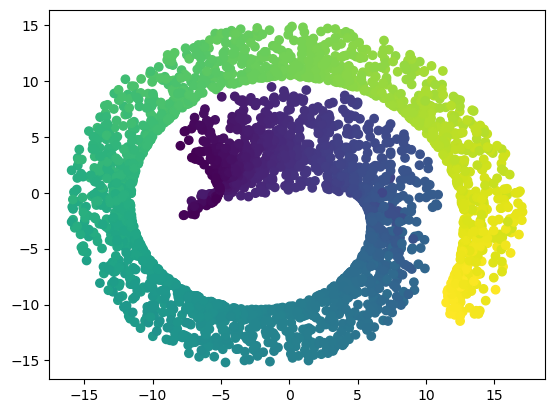

In [9]:
plt.scatter(embedding_bare[:,0], embedding_bare[:,1], c=color)

### 1.2 D&C SMACOF

In [10]:
embedding_dc, time_dc = benchmark(divide_conquer, DRMethod.SMACOF, X, l=l, c_points=c_points, r=r, verbose=2)

Projecting partition 1...
it: 0, stress 119895801.27097954
it: 0, stress 120004715.49953353
it: 0, stress 119854897.69500881
it: 1, stress 33173447.431102023
it: 1, stress 33369841.88364002
it: 0, stress 119816086.1555476
it: 0, stress 119912569.30937575
it: 0, stress 119996411.63650747
it: 0, stress 119946272.68937646
it: 1, stress 33321108.84099537
it: 0, stress 119746769.07853976
it: 2, stress 31216470.609882284
it: 2, stress 31320440.64473865
it: 1, stress 33231226.9263865
it: 1, stress 33344858.678670537
it: 1, stress 33674993.71605787
it: 1, stress 33201433.040000733
it: 1, stress 33046298.353913452
it: 2, stress 31292645.357291445
it: 2, stress 31270806.430563044
it: 2, stress 31391397.06831369
it: 3, stress 29969880.00849003
it: 2, stress 31590248.25749248
it: 3, stress 29924927.589214835
it: 2, stress 31232041.45159809
it: 2, stress 31033114.6410713
it: 3, stress 29979000.45618725
it: 3, stress 30049177.022289746
it: 3, stress 29912626.671069223
it: 3, stress 30140051.40829556

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 3, stress 29653304.9599993
it: 3, stress 29880513.52868509
it: 4, stress 29094671.006128818
it: 5, stress 28471317.535616834
it: 4, stress 29031145.665572688
it: 4, stress 29133139.22636706
it: 4, stress 28658978.56029558
it: 5, stress 28462800.017293092
it: 4, stress 28939998.035973623
it: 5, stress 28447611.501792327
it: 6, stress 28047764.163210787
it: 5, stress 28476550.250221923
it: 5, stress 28431537.30173091
it: 5, stress 28406051.52459331
it: 6, stress 28041330.353163794
it: 5, stress 27932457.72869138
it: 6, stress 28036458.188261006
it: 7, stress 27734957.95006355
it: 5, stress 28253307.356525946
it: 6, stress 28034396.95262508
it: 6, stress 27899117.830805745
it: 7, stress 27713951.616011743
it: 6, stress 27383980.71655479
it: 6, stress 27723274.395647146
it: 6, stress 27926985.234405488
it: 8, stress 27488036.099065404
it: 7, stress 27501356.95587472
it: 7, stress 27724792.075246774
it: 7, stress 26922213.805680126
it: 7, stress 27284130.155631837
it: 7, stress 27715097

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    3.1s remaining:    9.2s


it: 115, stress 5620772.425888916
it: 118, stress 5618003.055120031
it: 115, stress 5618126.281804224
it: 120, stress 5668948.173934108
it: 117, stress 5618016.508840961
it: 111, stress 5642214.728708625
it: 119, stress 5617998.691846172
it: 116, stress 5618111.316930252
it: 121, stress 5667561.098926965
it: 116, stress 5620649.430241076
it: 118, stress 5618012.327861033
it: 112, stress 5641336.102496765
it: 120, stress 5617994.960146969
it: 117, stress 5620536.871103756
it: 117, stress 5618098.182594053
it: 122, stress 5666268.507773041
it: 113, stress 5640585.688616574
it: 119, stress 5618008.726587119
it: 118, stress 5620433.911840315
it: 123, stress 5665075.110682557
it: 121, stress 5617991.7577960845
breaking at iteration 121 with stress 5617991.7577960845
it: 118, stress 5618086.492105466
it: 120, stress 5618005.616966572
breaking at iteration 120 with stress 5618005.616966572
it: 119, stress 5620339.6637768615
it: 114, stress 5639931.9822153365
it: 124, stress 5663970.42572687
i

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    4.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 0, stress 69706516.85958122
it: 0, stress 69742581.14792334
it: 0, stress 69799923.34695783
it: 0, stress 69706198.71735227
it: 0, stress 69763492.068927
it: 1, stress 19442807.28036933
it: 0, stress 69729578.50834903
it: 1, stress 19381633.490500137
it: 1, stress 19642769.342906717
it: 1, stress 19308819.00357105
it: 2, stress 18232790.87350697
it: 1, stress 19271037.67859648
it: 1, stress 19546101.526422933
it: 0, stress 69786713.90666758
it: 0, stress 69796679.11118224
it: 3, stress 17405434.39670701
it: 2, stress 18006327.640408922
it: 2, stress 18414051.27531774
it: 2, stress 18144793.180169646
it: 2, stress 18347667.23478194
it: 2, stress 18077932.314385783
it: 1, stress 19214508.684589017
it: 3, stress 17568978.792085238
it: 4, stress 16830929.924003124
it: 1, stress 19572670.943839308
it: 3, stress 17333252.84656371
it: 2, stress 18012200.21797038it: 3, stress 17263918.553212754

it: 3, stress 17162518.8051704
it: 2, stress 18308398.729180913
it: 4, stress 16769364.91924264

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    1.9s remaining:    5.8s


it: 152, stress 3259683.040928528
it: 164, stress 3257318.2340596872
it: 150, stress 4035946.217907889
it: 158, stress 3310180.589457494
it: 153, stress 3259537.714442623
it: 160, stress 3270310.3497322802
it: 151, stress 4035883.2191808866
it: 165, stress 3257305.001092013
it: 159, stress 3310163.1435970026
it: 154, stress 3259399.7144251834
it: 161, stress 3267319.249034783
it: 152, stress 4035823.2046284275
it: 160, stress 3310147.8608643557
it: 166, stress 3257293.9629817167
it: 155, stress 3259268.1264811326
it: 162, stress 3265226.542525026
it: 153, stress 4035766.46879584
it: 161, stress 3310134.345056413
it: 167, stress 3257284.760828625
it: 156, stress 3259141.158724903
it: 154, stress 4035712.858224928
it: 162, stress 3310122.2637062157
it: 163, stress 3263663.3580654394
it: 168, stress 3257277.064951674
it: 157, stress 3259017.8918077094
it: 155, stress 4035662.044878389
it: 164, stress 3262354.8956704475
it: 163, stress 3310111.3371033524
it: 158, stress 3258898.805912843
i

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    2.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Projecting partition 3...
it: 0, stress 71806949.33205147
it: 0, stress 71807574.45016667
it: 0, stress 71889128.99005134
it: 1, stress 20213703.118142996
it: 1, stress 20020987.000050485
it: 1, stress 19877637.037827533
it: 2, stress 19122775.875734493
it: 0, stress 71917440.05050033
it: 2, stress 18818001.116841447
it: 0, stress 71856178.68101421
it: 0, stress 71762289.14334863
it: 2, stress 18991893.874692857
it: 3, stress 18357236.68833674
it: 1, stress 20028511.649626918
it: 1, stress 20114775.343604688
it: 1, stress 20194139.891515594
it: 4, stress 17818407.23666322
it: 3, stress 18096026.869124897
it: 3, stress 18272869.139431432
it: 2, stress 18994248.207672264
it: 2, stress 18923622.600615222
it: 0, stress 71795519.6763722
it: 2, stress 19127481.937962025
it: 4, stress 17602729.14956374
it: 5, stress 17444190.41702519
it: 0, stress 71877540.27058272
it: 4, stress 17761223.982523274
it: 3, stress 18207758.467793897
it: 3, stress 18202296.915210616
it: 3, stress 18377241.2118266

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    2.2s remaining:    6.6s


it: 184, stress 3175647.9743662532
it: 175, stress 3176733.8545974703
it: 170, stress 4351527.992286448
it: 178, stress 3189286.240698881
it: 173, stress 3188977.7041905196
it: 185, stress 3175639.224580701
it: 171, stress 4351347.479642772
it: 176, stress 3176672.7227279823
it: 179, stress 3189255.646267174
it: 174, stress 3188964.2013774123
it: 186, stress 3175630.5350419
it: 177, stress 3176613.668891664
it: 180, stress 3189227.330766587
it: 172, stress 4351161.423226032
it: 175, stress 3188952.037113249
it: 176, stress 3188940.869098445
it: 173, stress 4350965.762481648
it: 178, stress 3176557.327938578
it: 187, stress 3175621.8893766757
it: 181, stress 3189200.3122657756
it: 177, stress 3188930.423324772
it: 182, stress 3189174.0313009326
it: 188, stress 3175613.2695261086
it: 174, stress 4350759.834911605
it: 179, stress 3176503.6419241503
it: 178, stress 3188920.4597514705
it: 175, stress 4350544.426760143
it: 183, stress 3189148.2023854824
it: 180, stress 3176452.390543636
it: 

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    3.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 3, stress 18448885.10909546
it: 3, stress 18470682.03674829
it: 3, stress 18474247.27800152
it: 5, stress 17489232.51354217
it: 3, stress 18372612.205368556
it: 1, stress 20297936.62842394
it: 4, stress 17947642.479127873
it: 4, stress 17899736.206937212
it: 6, stress 17423843.783727955
it: 6, stress 16946744.451844446
it: 4, stress 17861059.494668208
it: 4, stress 17954032.411047682
it: 6, stress 17208788.87828019
it: 7, stress 17205651.95396331
it: 5, stress 17595629.12550746
it: 2, stress 19223120.302958734
it: 5, stress 17474668.9283339
it: 7, stress 16655300.263155306
it: 5, stress 17517461.462583274
it: 3, stress 18492563.295927536
it: 6, stress 17335911.58137517
it: 7, stress 16979371.43883685
it: 5, stress 17579298.173219286
it: 6, stress 17136825.21113184
it: 8, stress 16369125.701301405
it: 8, stress 17009777.195698235
it: 6, stress 17264671.688656818
it: 7, stress 17131813.305060048
it: 6, stress 17304450.100515682
it: 4, stress 17999438.778492875
it: 7, stress 16838857.

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    2.4s remaining:    7.3s


it: 197, stress 3307836.160320393
it: 195, stress 3308056.1929865177
it: 197, stress 3312738.1713376683
it: 203, stress 4459524.122556804
it: 206, stress 3317774.6538088825
it: 191, stress 3318699.130219031
it: 196, stress 3308030.1042050626
it: 198, stress 3307809.816307965
it: 198, stress 3312568.6862392756
it: 204, stress 4459512.001442454
it: 192, stress 3318578.2314920984
it: 197, stress 3308004.239257228
it: 207, stress 3317668.236929511
it: 199, stress 3307784.1248772107
it: 193, stress 3318454.7022439726
it: 199, stress 3312400.2655554246
it: 208, stress 3317566.1637049755
it: 200, stress 3307759.1304120515
it: 205, stress 4459500.173574531
it: 198, stress 3307977.7441447396
it: 209, stress 3317469.016257364
it: 200, stress 3312234.160973541
it: 201, stress 3307735.834074356
it: 194, stress 3318328.0343008004
it: 206, stress 4459488.623407746
it: 199, stress 3307945.6588248205
it: 210, stress 3317375.5034477212
it: 202, stress 3307714.875970686
it: 207, stress 4459477.31986376


[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    3.3s finished


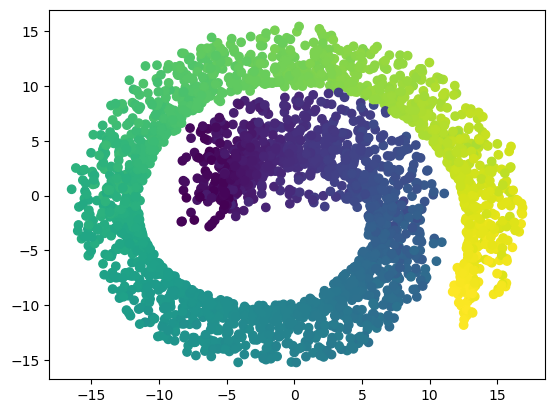

In [11]:
plt.scatter(embedding_dc[:,0], embedding_dc[:,1], c=color)

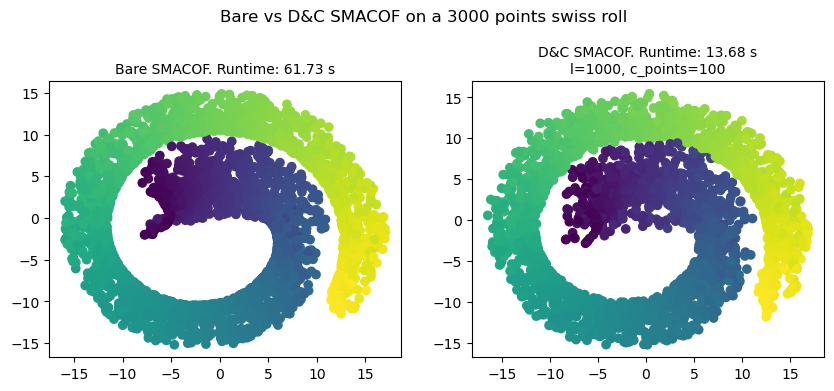

In [23]:
fig = plt.figure(figsize=(10,4))
fig.suptitle(f'Bare vs D&C SMACOF on a {n} points swiss roll')
fig.subplots_adjust(top=0.8)

ax1 = fig.add_subplot(121)
ax1.scatter(embedding_bare[:,0], embedding_bare[:,1], c=color)
ax1.set_title(f'Bare SMACOF. Runtime: {time_bare:.2f} s', fontsize=10)

ax2 = fig.add_subplot(122)
ax2.scatter(embedding_dc[:,0], embedding_dc[:,1], c=color)
ax2.set_title(f'D&C SMACOF. Runtime: {time_dc:.2f} s\nl={l}, c_points={c_points}', fontsize=10);

### 1.3 Larger datasets

We will first try to apply SMACOF to larger swiss rolls:
- With 10000 points, a Macbook Pro with 16 GB of RAM froze.

In [26]:
n, r = 5000, 2
l, c_points = 1000, 100
X, color = make_swiss_roll(n_samples=n, random_state=42)

In [27]:
embedding_bare, time_bare = benchmark(mds_smacof, X, r=r, verbose=2)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
python(28770) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(28771) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(28772) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(28773) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(28774) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(28775) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(28776) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(28777) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


it: 0, stress 2999903752.448912
it: 0, stress 2998742331.1738563
it: 0, stress 2999923044.259234
it: 0, stress 2998721731.2572174
it: 0, stress 2998847430.915751
it: 0, stress 2999324766.874486
it: 0, stress 2998515525.8057613
it: 0, stress 2999341751.822888
it: 1, stress 836469548.2534001
it: 1, stress 840862918.6674984
it: 1, stress 834717738.6080989
it: 1, stress 836064304.0633838
it: 1, stress 838635023.5711058
it: 1, stress 840132117.8760153
it: 1, stress 838351103.3383467
it: 1, stress 837913756.3036333
it: 2, stress 789672370.6210395
it: 2, stress 792977421.3211566
it: 2, stress 787909893.7653598
it: 2, stress 788955938.5123093
it: 2, stress 791815310.9093807
it: 2, stress 791634278.1952056
it: 2, stress 792678607.4507964
it: 2, stress 790677473.8488141
it: 3, stress 758747489.4521254
it: 3, stress 760726045.3372416
it: 3, stress 756626667.3227353
it: 3, stress 757002412.1325415
it: 3, stress 759781850.2594466
it: 3, stress 759987649.0173993
it: 3, stress 760642768.5179834
it: 3

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:  2.3min remaining:  6.9min


it: 212, stress 140965178.74380058
it: 213, stress 140894741.5887506
it: 213, stress 141036295.5749691
it: 213, stress 141038180.97848773
it: 212, stress 150557556.8428486
it: 213, stress 141182492.84520137
it: 213, stress 140965137.41479826
it: 214, stress 140894591.86455658
it: 214, stress 141036046.8921935
it: 214, stress 141037880.94312102
it: 213, stress 149817948.51836547
it: 214, stress 141175754.36842734
it: 214, stress 140965095.43619227
it: 215, stress 140894443.40285894
it: 215, stress 141037598.76184663
it: 215, stress 141035800.2378505
it: 214, stress 149117042.7797452
it: 215, stress 141169438.11597806
it: 215, stress 140965052.1774609
it: 216, stress 140894295.44585252
it: 216, stress 141035556.70524463
it: 216, stress 141037325.8626577
it: 215, stress 148451846.08345234
it: 216, stress 141163544.33823967
it: 216, stress 140965008.64863163
it: 217, stress 140894147.79993236
it: 217, stress 141035317.16380957
it: 217, stress 141037062.20738617
it: 216, stress 147829519.99

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:  3.0min finished


In [28]:
embedding_dc, time_dc = benchmark(divide_conquer,
                                  DRMethod.SMACOF, X, l=l, c_points=c_points, r=r, verbose=2)

Projecting partition 1...
it: 0, stress 121044592.93755071
it: 0, stress 121155934.09185685
it: 0, stress 121058025.74393207
it: 0, stress 121159048.39804837
it: 1, stress 33792155.48985589
it: 0, stress 121056956.07698981
it: 1, stress 33875389.84877324
it: 1, stress 33938113.592899516
it: 2, stress 31948971.31585657
it: 1, stress 33598863.673820205
it: 0, stress 121151784.6009684
it: 2, stress 32057075.047261033
it: 0, stress 121172406.19089812
it: 0, stress 121107888.5244633
it: 3, stress 30671172.134214506
it: 2, stress 32035836.650726378
it: 1, stress 33823268.82533085
it: 2, stress 31759304.701927893
it: 1, stress 34001428.23822298
it: 1, stress 33706610.21403561
it: 3, stress 30798415.50311395
it: 2, stress 31916792.86684835
it: 3, stress 30734978.941305663
it: 4, stress 29745967.181922436
it: 3, stress 30492800.78646899
it: 1, stress 33355644.021669783
it: 2, stress 32140480.82466369
it: 2, stress 31887679.873409413
it: 4, stress 29822482.7642177
it: 3, stress 30602411.77692404

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 7, stress 28128357.74084903
it: 4, stress 29381391.425553944
it: 6, stress 28475452.675271396
it: 7, stress 28256637.60473684
it: 5, stress 29212189.575606525
it: 5, stress 29219162.151370145
it: 7, stress 28250032.005579676
it: 6, stress 28490355.706318192
it: 7, stress 28055158.225109003
it: 5, stress 28804925.21131392
it: 6, stress 28723753.808167987
it: 6, stress 28774025.625677537
it: 8, stress 27765238.993572235
it: 8, stress 27914444.173734255
it: 6, stress 28377358.27559408
it: 7, stress 28081204.25831938
it: 8, stress 27678644.301868964
it: 7, stress 28431826.67707651
it: 9, stress 27605544.73280799
it: 8, stress 27857843.85723637
it: 7, stress 28335435.55359736
it: 9, stress 27414702.706520233
it: 7, stress 28038722.694821678
it: 9, stress 27313717.181673065
it: 10, stress 27300998.67225839
it: 9, stress 27478349.13791943
it: 8, stress 27722375.286840558
it: 8, stress 28006426.85845935
it: 8, stress 28167261.995884653
it: 10, stress 27041407.028027043
it: 8, stress 277407

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    7.2s remaining:   21.6s
[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    7.4s finished


it: 297, stress 5691884.536871468
it: 294, stress 5693613.734762084
it: 298, stress 5691878.5851131715
it: 295, stress 5693546.326696873
it: 299, stress 5691873.03467259
it: 296, stress 5693482.731858272
it: 297, stress 5693422.578198384
it: 298, stress 5693365.459779104
it: 299, stress 5693311.1681290325
Projecting partition 2...


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
python(28907) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


it: 0, stress 97625557.07280189
it: 0, stress 97713530.86838414
it: 0, stress 97651477.6710686
it: 0, stress 97674020.47044685
it: 0, stress 97672859.38383716
it: 1, stress 27049080.766258333
it: 1, stress 27073142.94018615
it: 1, stress 27246519.942180593
it: 2, stress 25472987.810818356
it: 1, stress 27358151.79739393
it: 2, stress 25484221.666653138
it: 1, stress 27166684.600983385
it: 0, stress 97826734.7462037
it: 2, stress 25839445.511463173
it: 2, stress 25655598.102096733
it: 3, stress 24346092.73751581
it: 3, stress 24392200.976256777
it: 1, stress 27298117.03798916
it: 3, stress 24774276.02611116
it: 2, stress 25663056.28686657
it: 3, stress 24596989.579061404
it: 2, stress 25742305.869712815
it: 4, stress 23519461.43613317it: 4, stress 24024492.76530843

it: 3, stress 24602651.786398508
it: 4, stress 23610438.42296453
it: 3, stress 24667729.60969753
it: 5, stress 23503414.027775224
it: 4, stress 23898876.206974976
it: 4, stress 23825947.81693057
it: 5, stress 23040274.007750

python(28908) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


it: 9, stress 20929361.989260204
it: 8, stress 22618263.616742283
it: 10, stress 22515507.125224926
it: 9, stress 21982114.144849807
it: 10, stress 21155050.18816848
it: 8, stress 22284125.319252536
it: 9, stress 22451122.284397066
it: 11, stress 22420032.698098052
it: 10, stress 20362622.52802105
it: 10, stress 21729317.121900544
it: 9, stress 22014225.37121883
it: 11, stress 20706484.0505633
it: 10, stress 22299473.802013297
it: 12, stress 22320385.437155195
it: 11, stress 21452073.977662534
it: 11, stress 19748281.882632196
it: 11, stress 22149782.00556965
it: 13, stress 22210491.260144122
it: 12, stress 20190663.716818534
it: 10, stress 21746597.773485877
it: 12, stress 21137847.16515152
it: 12, stress 21991520.59983688
it: 12, stress 19090217.117188327
it: 14, stress 22084394.477453955
it: 11, stress 21457766.01547365
it: 13, stress 19588502.307655692
it: 13, stress 20772117.2207429
it: 13, stress 18396484.461305927
it: 13, stress 21816724.56017429
it: 12, stress 21128202.04969887

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    1.9s remaining:    5.6s


it: 124, stress 5992284.873055767
it: 3, stress 24601939.912065648
it: 126, stress 4675076.563850629
it: 128, stress 5788955.421708808
it: 128, stress 5947394.937571462
it: 125, stress 5988668.970221768
it: 127, stress 4674437.541186105
it: 4, stress 23867444.27789192
it: 129, stress 5784617.406897918
it: 129, stress 5945818.661565742
it: 126, stress 5985156.255777606
it: 128, stress 4673827.172117278
it: 5, stress 23380613.17031624
it: 130, stress 5780059.36984803
it: 127, stress 5981717.587611316
it: 129, stress 4673257.622796385
it: 130, stress 5944332.141858772
it: 6, stress 23040404.142007615
it: 128, stress 5978333.44499997it: 131, stress 5775341.0843687225

it: 7, stress 22784243.31537674
it: 131, stress 5942928.299255439
it: 130, stress 4672734.732892697
it: 0, stress 97672515.74869108
it: 132, stress 5770591.99902259
it: 8, stress 22575547.23258944
it: 131, stress 4672255.594587929
it: 129, stress 5974988.415250968
it: 132, stress 5941670.6759536015it: 1, stress 27118075.62717

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 0, stress 97558872.6502384
it: 0, stress 97645965.315029
it: 0, stress 97681308.99169563
it: 0, stress 97613298.57154517
it: 1, stress 27263368.418088283
it: 1, stress 26991704.841585536
it: 1, stress 27103242.28589735
it: 1, stress 27538184.5669946
it: 0, stress 97599747.86914873
it: 0, stress 97608974.03100865
it: 2, stress 25585420.869480915
it: 2, stress 25392736.947862953
it: 2, stress 25796328.18958372
it: 2, stress 25890802.62298739
it: 1, stress 27186855.218406472
it: 0, stress 97666185.55342224
it: 1, stress 27560568.41130298
it: 3, stress 24513947.88188711
it: 3, stress 24259755.04218695
it: 3, stress 24798722.259808313
it: 3, stress 24791976.246217415
it: 2, stress 25590765.00183221
it: 4, stress 23737421.35250826
it: 1, stress 27375413.047286574
it: 2, stress 25878305.310614064
it: 4, stress 23478946.424581807
it: 3, stress 24458114.7904825
it: 4, stress 24072598.620080326
it: 4, stress 24053931.87572284
it: 5, stress 23162511.71863511
it: 2, stress 25869374.40433037
it

python(28910) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


it: 6, stress 23164013.327920888
it: 7, stress 22906852.26489325
it: 8, stress 22023056.052117236
it: 6, stress 23085302.54605068
it: 8, stress 21522205.798221786
it: 8, stress 22555976.945370216
it: 8, stress 21574408.548934292
it: 8, stress 22710692.622826204
it: 7, stress 22909798.90618079
it: 9, stress 21707585.882247012
it: 9, stress 21010505.0201542
it: 7, stress 22776256.05720441
it: 9, stress 22547728.263211817
it: 9, stress 21100737.505434707
it: 8, stress 22706578.432467166
it: 8, stress 22516319.226064738
it: 10, stress 20435501.51480696
it: 10, stress 22396146.078925155
it: 10, stress 20567850.819810092
it: 9, stress 22536767.175512724
it: 9, stress 22322806.430225737
it: 11, stress 19774123.859796744
it: 10, stress 21382553.975567877
it: 11, stress 22241045.428673226
it: 9, stress 22281054.34951464
it: 11, stress 21032484.739439752
it: 12, stress 19019701.41966667
it: 10, stress 22090402.803022265
it: 10, stress 22386748.101170894
it: 12, stress 22071088.37117103
it: 10, s

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    1.9s remaining:    5.7s


it: 113, stress 4564858.6004239
it: 109, stress 4568346.134935166
it: 118, stress 4546464.405032213
it: 117, stress 4589440.897738624
it: 2, stress 25514646.5490473
it: 117, stress 4922213.021593243
it: 114, stress 4564583.627639567
it: 119, stress 4546400.951171028
it: 118, stress 4906353.805671175
it: 118, stress 4587943.098303068
it: 110, stress 4565040.682718029
it: 115, stress 4564332.0296188295
it: 3, stress 24481203.03644236
it: 111, stress 4562051.063931541it: 119, stress 4586442.955000109

it: 119, stress 4891090.962358683
it: 120, stress 4546343.284626249
it: 116, stress 4564096.5193424
it: 4, stress 23792933.06661559
it: 120, stress 4584978.094911001
it: 112, stress 4559568.191367947
it: 120, stress 4876106.101495687
it: 121, stress 4546290.459554384
it: 117, stress 4563866.334451304
it: 5, stress 23322755.227290355
it: 121, stress 4583604.799871381
it: 113, stress 4557484.276202839
it: 122, stress 4546241.834847066
it: 121, stress 4861870.859764697
it: 118, stress 4563644.5

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    3.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
python(28911) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


it: 0, stress 95563237.62207468
it: 0, stress 95466818.72719438
it: 0, stress 95602069.77628742
it: 0, stress 95588716.62174812
it: 0, stress 95557155.7227163
it: 0, stress 95548197.62611958
it: 1, stress 26603718.128195077
it: 1, stress 26707141.691494305
it: 1, stress 26332318.788342413
it: 1, stress 26498768.087603096
it: 1, stress 26339679.199049577
it: 1, stress 26637699.745563
it: 2, stress 25042323.843998715
it: 2, stress 24747777.048673645
it: 0, stress 95501490.19968246
it: 2, stress 24942677.22394191
it: 2, stress 24677839.262647077
it: 2, stress 24795057.95516438
it: 2, stress 24920388.057505567
it: 3, stress 23856512.2159986
it: 1, stress 26571745.06824297
it: 3, stress 23686326.273987077
it: 3, stress 23564787.487607468
it: 3, stress 23697830.19598338
it: 3, stress 23837492.42852311
it: 3, stress 23773062.990523905
it: 4, stress 23024472.47885961
it: 4, stress 22947093.446205225
it: 2, stress 24869479.081585955
it: 5, stress 22472751.00091305
it: 4, stress 22969659.0012005

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    2.5s remaining:    7.6s


it: 147, stress 5316518.883416422
it: 143, stress 5201760.164250169
it: 153, stress 4818865.13865804
it: 34, stress 12774834.802399796
it: 153, stress 5194371.045587952
it: 148, stress 5316243.31925687
it: 144, stress 5201426.370812601
it: 154, stress 4816825.224601938
it: 35, stress 12470564.029763889
it: 154, stress 5194326.242973637
it: 145, stress 5201115.453139672
it: 149, stress 5315985.001079073
it: 36, stress 12178825.509718284
it: 155, stress 4814322.64126522
it: 155, stress 5194286.733006424
it: 150, stress 5315746.416046395
it: 146, stress 5200827.527896224
it: 37, stress 11898408.35791493
it: 156, stress 4811006.4068201855
it: 156, stress 5194251.244223334
it: 147, stress 5200555.1296879565
it: 151, stress 5315530.08941502
it: 157, stress 4806959.3997728275
it: 38, stress 11625124.713786306
it: 157, stress 5194217.996074969
it: 148, stress 5200285.475717409
it: 152, stress 5315336.010062912
it: 158, stress 4802485.098249996
it: 39, stress 11362482.227189412
it: 158, stress 

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    4.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 0, stress 95307759.68616688
it: 0, stress 95313050.8395552
it: 0, stress 95192131.61795554
it: 1, stress 26505753.922278933
it: 0, stress 95212795.24838363
it: 1, stress 26607719.995107673
it: 2, stress 24845768.397451986
it: 0, stress 95393564.81262279
it: 1, stress 26428327.614217997
it: 0, stress 95362030.19443755
it: 1, stress 26338366.401653226
it: 2, stress 24898820.310988892
it: 1, stress 26476425.3220478
it: 1, stress 26319396.573048215
it: 3, stress 23742219.71865047
it: 2, stress 24837902.656847943
it: 0, stress 95409280.34715049
it: 3, stress 23730778.44898166
it: 2, stress 24822057.03519999
it: 2, stress 24704742.21695165
it: 4, stress 22937479.690894183
it: 4, stress 22973392.857779186
it: 1, stress 26182889.301386148
it: 3, stress 23727579.773815446
it: 3, stress 23788372.932803307
it: 2, stress 24685934.602446392
it: 3, stress 23663569.674280565
it: 4, stress 22978803.369095784
it: 2, stress 24560356.200643446
it: 5, stress 22436211.617058665
it: 5, stress 22362441.7

python(28925) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


it: 7, stress 21860807.80177202
it: 9, stress 21089169.85370404
it: 5, stress 22223489.43341299
it: 7, stress 21624371.914753444
it: 7, stress 21896399.814387172
it: 6, stress 21933678.565812804
it: 8, stress 21656795.21111619
it: 8, stress 21325919.52433301
it: 10, stress 20775554.039654996
it: 8, stress 21293182.390793234
it: 8, stress 21659194.38301696
it: 6, stress 21809530.230535094
it: 7, stress 21580801.91615594
it: 9, stress 21475560.30410505
it: 9, stress 21057517.184201714
it: 11, stress 20429525.02029315
it: 9, stress 20967204.932716087
it: 9, stress 21434867.004966207
it: 7, stress 21464537.636170927
it: 10, stress 21293486.439014215
it: 8, stress 21257131.276629206
it: 10, stress 20620201.776953988
it: 10, stress 21203387.692432404
it: 12, stress 20045574.687789198
it: 10, stress 20772392.26823313
it: 9, stress 20941943.186474238
it: 11, stress 21094870.890535675
it: 11, stress 20950577.90393717
it: 8, stress 21147764.850096725
it: 11, stress 20455931.249560244
it: 13, str

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    4.0s remaining:   12.1s


it: 228, stress 4502218.986619636
it: 227, stress 4500296.760774226
it: 224, stress 4520794.910189071
it: 231, stress 5687370.226415521
it: 118, stress 4504814.584000658
it: 226, stress 4502969.768075958
it: 228, stress 4500235.204509838
it: 232, stress 5687361.937481632
it: 119, stress 4504722.549478504
it: 229, stress 4502199.54313829
it: 225, stress 4520369.671187324
it: 227, stress 4502936.206573893
it: 233, stress 5687354.055960025
it: 229, stress 4500164.051136786
it: 228, stress 4502900.982571674
it: 230, stress 4502180.46606566
it: 120, stress 4504633.045302317
it: 226, stress 4519999.071637598
it: 230, stress 4500090.822044529
it: 234, stress 5687346.545189128
it: 227, stress 4519685.356744785
it: 231, stress 4502162.463803078
it: 121, stress 4504546.482116005
it: 229, stress 4502863.97130767
it: 231, stress 4500020.499969511
it: 235, stress 5687339.374224043
it: 122, stress 4504465.21221662
it: 232, stress 4502145.430017508
it: 228, stress 4519383.74075356
it: 230, stress 450

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    5.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 0, stress 98627350.60943864
it: 0, stress 98612938.62142575
it: 0, stress 98666298.41562063
it: 1, stress 27038004.470751833
it: 1, stress 27246484.89751974
it: 0, stress 98647755.61283131
it: 1, stress 27531808.528707296
it: 2, stress 25517262.93513787
it: 0, stress 98661585.83486514
it: 2, stress 25655138.266942255
it: 2, stress 25915735.599038154
it: 1, stress 27383611.380567823


python(28926) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


it: 1, stress 27313753.237164445
it: 3, stress 24766937.3807407
it: 0, stress 98639465.4337176
it: 0, stress 98733740.04997732
it: 3, stress 24512716.92627156
it: 2, stress 25757388.08453682
it: 3, stress 24538883.975959957
it: 2, stress 25705482.884399973
it: 4, stress 23944358.93209343
it: 1, stress 27648748.872363362
it: 3, stress 24627108.93916639
it: 4, stress 23816999.87896391
it: 5, stress 23325396.64020204
it: 4, stress 23758715.280278206
it: 3, stress 24560484.329556033
it: 1, stress 27253195.31771602
it: 4, stress 23841389.6165012
it: 5, stress 23326732.63069837
it: 6, stress 22831927.447374854
it: 2, stress 26072748.83964989
it: 4, stress 23734191.505539227
it: 2, stress 25736531.407094732
it: 5, stress 23202841.51457861
it: 7, stress 22412468.05855878
it: 3, stress 24955373.40910911
it: 5, stress 23268577.83846295
it: 5, stress 23108835.76611232
it: 3, stress 24752910.587447945
it: 6, stress 22968584.586167566
it: 4, stress 24133217.710885983
it: 8, stress 22016503.44069909

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    4.2s remaining:   12.6s


it: 239, stress 4853874.268695631
it: 253, stress 4855826.745685912
it: 255, stress 4853327.446356062
it: 245, stress 4858149.926638814
it: 246, stress 4858041.464512572
it: 240, stress 4853816.840512367
it: 254, stress 4855799.784095522
it: 246, stress 4858145.78218035
it: 256, stress 4853291.099723442
it: 247, stress 4858037.69971558
breaking at iteration 247 with stress 4858037.69971558
it: 255, stress 4855772.4309963435
it: 241, stress 4853759.416829708
it: 247, stress 4858141.61037169
it: 257, stress 4853255.449337663
it: 256, stress 4855744.134555431
it: 242, stress 4853702.820539648
it: 248, stress 4858137.365147992
it: 258, stress 4853221.02986579
it: 257, stress 4855714.371790951
it: 243, stress 4853648.382883815
it: 249, stress 4858132.9330694955
it: 259, stress 4853188.278965309
it: 258, stress 4855683.066785988
it: 244, stress 4853596.751487755
it: 250, stress 4858128.05273973
it: 260, stress 4853157.145106416
it: 259, stress 4855650.530508371
it: 245, stress 4853548.066976

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    4.9s finished


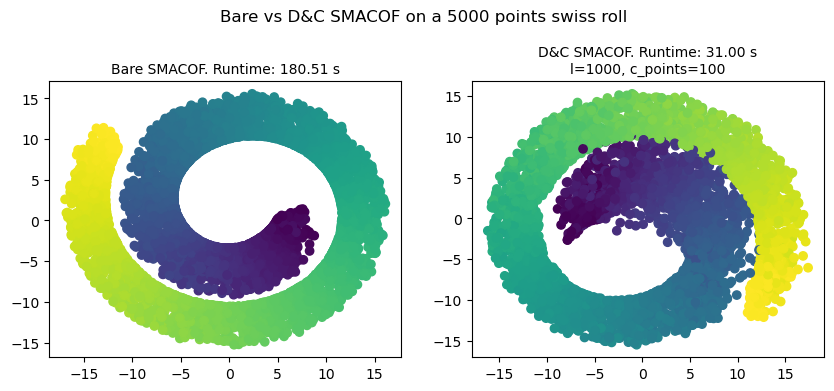

In [29]:
fig = plt.figure(figsize=(10, 4))
fig.suptitle(f'Bare vs D&C SMACOF on a {n} points swiss roll')
fig.subplots_adjust(top=0.8)

ax1 = fig.add_subplot(121)
ax1.scatter(embedding_bare[:, 0], embedding_bare[:, 1], c=color)
ax1.set_title(f'Bare SMACOF. Runtime: {time_bare:.2f} s', fontsize=10)

ax2 = fig.add_subplot(122)
ax2.scatter(embedding_dc[:, 0], embedding_dc[:, 1], c=color)
ax2.set_title(
    f'D&C SMACOF. Runtime: {time_dc:.2f} s\nl={l}, c_points={c_points}', fontsize=10);

In [30]:
n, r = 7500, 2
l, c_points = 1000, 100
X, color = make_swiss_roll(n_samples=n, random_state=42)

In [31]:
embedding_bare, time_bare = benchmark(mds_smacof, X, r=r, verbose=2)
embedding_dc, time_dc = benchmark(divide_conquer,
                                  DRMethod.SMACOF, X, l=l, c_points=c_points, r=r, verbose=2)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
python(28969) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


it: 0, stress 6785551484.669111
it: 0, stress 6787194553.696431
it: 0, stress 6789973875.358486
it: 0, stress 6788513963.437645
it: 0, stress 6787290414.580833
it: 0, stress 6786986685.403631
it: 0, stress 6788340449.0687895
it: 1, stress 1896477435.9102306
it: 0, stress 6785820525.206191
it: 1, stress 1892618584.640999
it: 1, stress 1897602731.2476761
it: 1, stress 1892423529.8020449
it: 1, stress 1889787041.0495875
it: 1, stress 1897278122.284449
it: 1, stress 1897726463.6816354
it: 2, stress 1787145268.3475296
it: 2, stress 1790115163.1695313
it: 2, stress 1790806770.6848097
it: 2, stress 1786157367.963459
it: 2, stress 1790560322.6309547
it: 2, stress 1787405377.2234924
it: 2, stress 1790644264.5299513
it: 1, stress 1895178051.4429574
it: 3, stress 1714987743.459517
it: 3, stress 1716643277.029753
it: 3, stress 1718800645.6386096
it: 3, stress 1718595515.5099308
it: 3, stress 1717320870.6450481
it: 3, stress 1717953475.6632981
it: 3, stress 1718183893.4021199
it: 4, stress 16707445

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed: 18.5min remaining: 55.6min


it: 201, stress 329928197.6571831
it: 200, stress 327510687.5226655
it: 204, stress 408658525.65409225
it: 203, stress 327895867.4886847
it: 201, stress 326110320.1094635
it: 206, stress 325616948.43603444
it: 202, stress 329795869.2046419
it: 201, stress 327503476.48642695
it: 205, stress 408655741.70905113
it: 202, stress 326099343.17678404
it: 207, stress 325605933.49576634
it: 204, stress 327882008.8105551
it: 203, stress 329668803.62483555
it: 202, stress 327496238.2847806
it: 206, stress 408653060.9794841
it: 205, stress 327868867.4950496
it: 203, stress 326088318.5406266
it: 208, stress 325594931.9590237
it: 204, stress 329542703.4050151
it: 203, stress 327488996.77503407
it: 207, stress 408650476.22415406
it: 206, stress 327856426.8600101
it: 204, stress 326077283.9489122
it: 209, stress 325583939.08809155
it: 205, stress 329413170.86628336
it: 204, stress 327481807.5879161
it: 208, stress 408647979.19342196
it: 207, stress 327844661.10139734
it: 205, stress 326066239.75581545


[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed: 20.3min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 0, stress 117869795.42929885
it: 0, stress 117974290.7924591
it: 1, stress 32707150.247491356
it: 0, stress 117811553.24635543
it: 1, stress 32906650.30843943
it: 2, stress 30585721.718299948
it: 0, stress 117877797.20527175
it: 2, stress 30886501.12226431
it: 1, stress 32316458.940075275
it: 3, stress 29187486.91641962
it: 1, stress 32864859.076858487
it: 0, stress 117928204.61771326
it: 3, stress 29511531.19993325
it: 0, stress 117909015.43612507
it: 0, stress 117859806.10012431
it: 2, stress 30347864.312113956
it: 2, stress 30868780.027883366
it: 1, stress 33250872.65398937
it: 4, stress 28271251.079027668
it: 0, stress 117954660.08107159
it: 4, stress 28518585.055361386
it: 1, stress 32846018.921467576
it: 1, stress 32685648.56187745
it: 3, stress 29548887.042550925
it: 5, stress 27656694.242322817
it: 1, stress 32904105.208285343
it: 3, stress 29034818.97618705
it: 2, stress 31147354.34363503
it: 5, stress 27793763.27892636
it: 2, stress 30796244.311037607
it: 2, stress 307550

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    3.9s remaining:   11.7s


it: 174, stress 5571957.055383492
it: 165, stress 5394803.5453877
it: 174, stress 7590701.214620409
it: 169, stress 5391952.408433443
it: 165, stress 5391646.74491044
it: 175, stress 5556348.1059852345
it: 166, stress 5394329.105861072
it: 170, stress 5391720.548784762
it: 175, stress 7586082.686525406
it: 166, stress 5391420.046815124
it: 176, stress 5541869.954561373
it: 167, stress 5393893.214125412
it: 176, stress 7581418.97868345
it: 171, stress 5391505.066081629
it: 167, stress 5391215.212104019
it: 177, stress 5528829.186191419
it: 168, stress 5393495.28979644
it: 177, stress 7576644.783794357
it: 172, stress 5391304.779682593
it: 168, stress 5391031.480813269
it: 178, stress 7571736.323285425
it: 178, stress 5516879.776496189
it: 169, stress 5393133.393825861
it: 173, stress 5391118.452540712
it: 169, stress 5390866.706027759
it: 179, stress 7566533.0703343805
it: 179, stress 5506391.359481598
it: 170, stress 5392804.12325564
it: 174, stress 5390947.433808515
it: 170, stress 53

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    5.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 0, stress 100605008.32399988
it: 0, stress 100571556.71477012
it: 0, stress 100503248.49691613
it: 1, stress 28179345.89457882
it: 1, stress 27914689.37661246
it: 0, stress 100546315.54148747
it: 0, stress 100592357.25811192
it: 1, stress 27818157.989338648
it: 0, stress 100602821.4588422
it: 1, stress 28119470.74477281
it: 0, stress 100626174.75317174
it: 2, stress 26111318.39367591
it: 1, stress 27919202.15773503
it: 2, stress 26415175.55553711
it: 2, stress 26008584.35517585
it: 3, stress 24900563.908345256
it: 2, stress 26316883.336244717
it: 1, stress 28036488.50584865
it: 0, stress 100635191.72252108
it: 3, stress 24814577.99606912
it: 1, stress 27795649.350659605
it: 3, stress 25190565.15242714
it: 2, stress 26203979.9132971
it: 1, stress 27882333.261967327
it: 2, stress 26205284.021842632
it: 3, stress 25098129.950902257
it: 4, stress 24120132.03031216
it: 4, stress 24366289.768983103
it: 4, stress 24020101.611709017
it: 3, stress 25044387.80230258
it: 2, stress 26205122.45

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    3.0s remaining:    8.9s


it: 166, stress 4719918.911055474
it: 165, stress 6017928.1784311645
it: 162, stress 4720105.472116513
it: 158, stress 4719027.248996116
it: 167, stress 4714757.987278499
it: 170, stress 4716469.578035034
it: 167, stress 4719718.171515743
it: 159, stress 4718776.539883587
it: 163, stress 4719716.1927722525
it: 166, stress 6017757.169432742
it: 171, stress 4716468.104259707
it: 168, stress 4714709.136844186
it: 168, stress 4719522.685371642
it: 167, stress 6017587.980338997
it: 160, stress 4718558.358212987
it: 172, stress 4716466.671907083
it: 164, stress 4719378.028203822
it: 169, stress 4714661.897925325
it: 169, stress 4719334.266879224
it: 168, stress 6017420.933398773
it: 161, stress 4718367.749962055
it: 165, stress 4719085.248798458
it: 173, stress 4716465.274530076
it: 170, stress 4714616.90793997
it: 170, stress 4719154.037374539
it: 169, stress 6017254.011222445
it: 162, stress 4718201.415769378
it: 166, stress 4718830.427981758
it: 171, stress 4714574.157812086
it: 171, stre

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    4.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 1, stress 28535510.411625393
it: 1, stress 28976539.081553534
it: 0, stress 103297686.57392319
it: 2, stress 27208920.274460122
it: 1, stress 28758007.274038024
it: 1, stress 28928699.934811037
it: 0, stress 103280964.44208573
it: 2, stress 26991540.362855293
it: 2, stress 27439841.256290443
it: 0, stress 103321145.04106598
it: 2, stress 27206462.801283006
it: 3, stress 26125408.429211207
it: 3, stress 25957989.949995548
it: 1, stress 29056753.268564865
it: 2, stress 27440245.356736984
it: 3, stress 26179956.234891158
it: 3, stress 26333731.45830858
it: 1, stress 28854693.91507823
it: 4, stress 25344768.12431907
it: 4, stress 25240743.657841027
it: 2, stress 27468458.55456731
it: 2, stress 27254964.733806312
it: 4, stress 25501758.501928557
it: 0, stress 103214759.2089333
it: 3, stress 26425117.072765086
it: 5, stress 24751198.009907935
it: 5, stress 24864524.00364845
it: 3, stress 26353460.62024608
it: 5, stress 24711823.203971952
it: 4, stress 25485224.251442935
it: 4, stress 256

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    4.6s remaining:   13.7s


it: 254, stress 4863297.718506585
it: 264, stress 4862711.667125569
it: 263, stress 4857539.86857909
it: 262, stress 4862883.947155221
it: 260, stress 6123624.547279774
it: 255, stress 4863143.949628183
it: 263, stress 4862877.1210484905
it: 265, stress 4862674.056890845
it: 264, stress 4857527.433331769
it: 261, stress 6123596.180396242
it: 256, stress 4862992.94354071
it: 266, stress 4862617.591329384
it: 264, stress 4862870.276110269
it: 265, stress 4857515.429594427
it: 262, stress 6123568.356373275
it: 257, stress 4862847.397456522
it: 267, stress 4862540.502727715
it: 266, stress 4857503.843530304
it: 263, stress 6123540.97384639
it: 265, stress 4862863.416506845
it: 258, stress 4862708.096676209
it: 267, stress 4857492.656084889
it: 264, stress 6123513.84918966
it: 268, stress 4862429.693036317
it: 266, stress 4862856.546548685
it: 259, stress 4862574.369679327
it: 265, stress 6123486.765064377
it: 269, stress 4862295.328997416
it: 268, stress 4857481.847037536
it: 267, stress 4

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    5.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 0, stress 101052727.07855403
it: 0, stress 100987394.65973924


python(29943) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


it: 0, stress 101007490.13303007
it: 0, stress 101027568.2548864
it: 0, stress 100978075.56806917
it: 1, stress 28132713.401041213
it: 0, stress 100908100.50889857
it: 1, stress 28106126.41282058
it: 1, stress 28001229.8425654
it: 1, stress 28188164.887005296
it: 0, stress 100915422.15007082
it: 1, stress 28050158.809105862
it: 2, stress 26543111.176703237
it: 2, stress 26583801.3375479
it: 2, stress 26343616.564631283
it: 1, stress 28081844.408553902
it: 1, stress 28221274.720229603
it: 2, stress 26414718.17664456
it: 2, stress 26409460.106377568
it: 3, stress 25468185.93151129
it: 2, stress 26535590.035180427
it: 2, stress 26354932.212617774
it: 3, stress 25226658.432500955
it: 3, stress 25489659.560524877
it: 3, stress 25244399.572474845
it: 4, stress 24733565.896286067
it: 3, stress 25295828.29443671
it: 3, stress 25203680.851211276it: 4, stress 24493274.996517085

it: 3, stress 25400325.081444383
it: 4, stress 24752155.445501387
it: 5, stress 24235146.88503007
it: 4, stress 245305

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    2.4s remaining:    7.2s


it: 140, stress 4759644.696386725
it: 145, stress 4630343.962901624
it: 5, stress 24007001.95782204
it: 140, stress 4630006.643878174
it: 140, stress 4738227.579324597
it: 141, stress 4758854.554754474
it: 146, stress 4630318.589892659
it: 141, stress 4737083.869598126
it: 142, stress 4758073.365272136
it: 6, stress 23579898.60866516
it: 141, stress 4629990.7669661315
it: 147, stress 4630295.792064927
it: 142, stress 4735924.01959437
it: 143, stress 4757309.688034064
it: 7, stress 23269216.973975893
it: 142, stress 4629974.763772681
it: 143, stress 4734733.994386948
it: 144, stress 4756539.725282814
it: 148, stress 4630275.263667661
it: 8, stress 23033280.8469169
it: 143, stress 4629959.039556788
it: 144, stress 4733558.6326128915
it: 149, stress 4630256.72729514
it: 145, stress 4755760.451938176
it: 9, stress 22833953.6889254
it: 144, stress 4629944.003910374
it: 145, stress 4732403.522678259
it: 150, stress 4630239.926916725
it: 146, stress 4754961.262638765
it: 10, stress 22641216.0

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    4.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 0, stress 101472015.57580683
it: 3, stress 25485760.946656648
it: 1, stress 28148770.352089062it: 2, stress 26963100.440148115

it: 3, stress 25345669.35960862
it: 2, stress 26717486.99719924
it: 2, stress 26692196.701586172
it: 0, stress 101447983.091241
it: 4, stress 24799644.86575156
it: 4, stress 24605070.979206704
it: 1, stress 28387417.825190492
it: 3, stress 25653035.22889662
it: 1, stress 28116385.139088746
it: 3, stress 25582075.501404975
it: 2, stress 26537490.37450441
it: 3, stress 25838127.519703478
it: 5, stress 24065771.444111984
it: 5, stress 24324234.710786402
it: 4, stress 25060633.18393999
it: 4, stress 24767639.42450439
it: 4, stress 24937237.378401507
it: 3, stress 25418832.50283229
it: 2, stress 26818712.02009317
it: 6, stress 23651673.77099625
it: 6, stress 23989839.672259595
it: 2, stress 26556970.125046175
it: 5, stress 24180697.85547674
it: 5, stress 24521451.127608977
it: 5, stress 24416546.381894916
it: 3, stress 25726067.276715804
it: 3, stress 25474848.

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    3.2s remaining:    9.7s


it: 172, stress 5035635.933708746
it: 167, stress 5053460.788944431
it: 162, stress 5947218.72308729
it: 171, stress 5893962.990962702
it: 167, stress 5042404.344091633
it: 169, stress 5051080.851118271
it: 168, stress 5041770.120648693
it: 173, stress 5035613.750365716
it: 168, stress 5053308.3006337
it: 172, stress 5893905.78689534
it: 163, stress 5946512.91459508
it: 174, stress 5035591.616962948
it: 170, stress 5047723.718817911
it: 169, stress 5041190.925168348
it: 169, stress 5053167.126488155
it: 173, stress 5893852.047547038
it: 164, stress 5945881.069999707
it: 175, stress 5035569.614184583
it: 171, stress 5045131.318831256
it: 170, stress 5053030.937267279
it: 170, stress 5040665.223579483
it: 174, stress 5893801.459140678
it: 165, stress 5945325.445144764
it: 176, stress 5035547.875897249
it: 172, stress 5043131.201285032
it: 171, stress 5052892.995998198
it: 175, stress 5893753.672069554
it: 171, stress 5040181.478813011
it: 166, stress 5944835.487787454
it: 177, stress 503

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    4.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Projecting partition 6...
it: 0, stress 96675577.66501212
it: 0, stress 96718417.09140569
it: 0, stress 96820899.61596519
it: 1, stress 27270183.998187765
it: 0, stress 96704125.6006505
it: 1, stress 26658124.84460932
it: 0, stress 96652906.20427467
it: 0, stress 96689835.43219723
it: 1, stress 26860108.13364679
it: 2, stress 25575610.22319274
it: 1, stress 26521182.948830772it: 0, stress 96749385.6577593

it: 0, stress 96735278.32608914
it: 1, stress 26777411.08507667
it: 1, stress 26739759.115801804
it: 2, stress 25011247.475280583
it: 1, stress 26589807.739882935
it: 2, stress 25187642.23046861
it: 2, stress 24884872.839334447
it: 1, stress 26787059.16978047
it: 3, stress 24366878.50519647
it: 2, stress 25092031.577056184
it: 2, stress 24982620.787900764
it: 2, stress 25060261.753376674
it: 3, stress 24065861.64930755
it: 3, stress 23920252.864746973
it: 4, stress 23474435.331702907
it: 2, stress 25130053.944987364
it: 3, stress 23817566.59816553
it: 4, stress 23304416.063868646
it:

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    3.5s remaining:   10.5s


it: 191, stress 4479364.173059656
it: 197, stress 4530079.034116137
it: 197, stress 5504581.367073898
it: 195, stress 4497722.836653856
it: 192, stress 4514098.017178786
it: 194, stress 4488012.196243681
it: 192, stress 4479342.029955382
it: 198, stress 5474378.824113295
it: 198, stress 4529863.074968692
it: 196, stress 4497236.410416198
it: 193, stress 4513925.595835265
it: 193, stress 4479325.006210877
it: 199, stress 5445854.5626973985
it: 199, stress 4529648.668208867
it: 195, stress 4487913.033335986
it: 194, stress 4513753.415111008
it: 197, stress 4496746.729234931
it: 194, stress 4479311.542265111
it: 200, stress 5419258.226492405
it: 200, stress 4529432.253707477
it: 196, stress 4487812.752615481
it: 195, stress 4479300.591573367
it: 195, stress 4513583.589259815
it: 198, stress 4496243.378714864
it: 201, stress 5393679.717909979
it: 201, stress 4529203.790955883
it: 197, stress 4487712.444159386
it: 196, stress 4479291.455652433
it: 199, stress 4495766.101668571
it: 196, stre

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 2, stress 27082769.643313266
it: 3, stress 25719488.287765313
it: 2, stress 26831121.455196522
it: 2, stress 27068157.894995153
it: 3, stress 26055484.575129904
it: 1, stress 28549942.839281928
it: 1, stress 28731088.206877712
it: 1, stress 28262897.488645088
it: 3, stress 26037576.32687512
it: 4, stress 24997471.89666594it: 3, stress 26058182.302244205

it: 3, stress 25773425.690766484
it: 4, stress 25333570.788049582
it: 2, stress 27092099.825626478
it: 2, stress 27116045.908861678
it: 4, stress 25359027.259609606
it: 2, stress 26796019.74676673
it: 4, stress 24975200.70831423
it: 4, stress 25286486.46659015
it: 5, stress 24785112.532785382
it: 3, stress 26023800.06941141
it: 3, stress 26125384.02763484
it: 5, stress 24462001.63964825
it: 6, stress 24027805.704049118
it: 6, stress 24356450.472740293
it: 5, stress 24340031.317803957
it: 3, stress 25827382.143073585
it: 5, stress 24866003.72597786
it: 5, stress 24718883.37690503
it: 4, stress 25262832.99404675
it: 4, stress 2545497

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    3.7s remaining:   11.0s


it: 198, stress 4988212.848433624
it: 198, stress 4984488.55227399
it: 198, stress 4984428.023102392
it: 196, stress 4984800.190161002
it: 195, stress 4985585.813629564
it: 197, stress 4985565.750765538
it: 199, stress 4988062.195136243
it: 199, stress 4984425.003459659
it: 199, stress 4984482.879270678
it: 198, stress 4985530.813389421
it: 197, stress 4984782.939599312
it: 196, stress 4985535.4209461445
it: 200, stress 4987920.871633718
it: 200, stress 4984477.475206526
it: 200, stress 4984422.239290277
it: 199, stress 4985498.006252885
it: 198, stress 4984765.448265338
it: 197, stress 4985485.975325062
it: 201, stress 4987787.046800187
it: 200, stress 4985467.083338996
it: 201, stress 4984419.695671552
it: 201, stress 4984472.336300677
it: 198, stress 4985437.495076699
it: 202, stress 4987658.962687965
it: 199, stress 4984748.155815539
it: 202, stress 4984417.342751765
it: 201, stress 4985437.759740955
it: 199, stress 4985389.911848706
it: 203, stress 4987533.482555927
it: 202, stres

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    4.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 1, stress 28351033.267128512
it: 0, stress 101231170.41548567
it: 1, stress 28339868.843881983
it: 1, stress 28166667.094648186
it: 1, stress 28165798.74988505
it: 2, stress 26575215.774584536
it: 3, stress 25732457.307210095
it: 2, stress 26633568.339484643
it: 1, stress 28205510.926702466
it: 2, stress 26597367.323123578
it: 3, stress 25476412.046540808
it: 2, stress 26791015.647571128
it: 3, stress 25536227.445005555
it: 2, stress 26704495.112880196
it: 2, stress 26888223.04461058
it: 3, stress 25552881.735161364
it: 4, stress 25033364.324834414
it: 3, stress 25732530.208358172
it: 3, stress 25557801.461637244
it: 4, stress 24840895.396364223
it: 3, stress 25728951.635996055
it: 4, stress 24753535.026678078
it: 3, stress 25878119.780570988
it: 4, stress 24764426.27420361
it: 5, stress 24354798.04458213
it: 5, stress 24246392.785142373
it: 4, stress 24853856.09391786
it: 4, stress 24972052.52740254
it: 4, stress 25156057.615458082
it: 4, stress 25067396.597262204
it: 5, stress 24

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    2.4s remaining:    7.3s


it: 137, stress 4710390.87828025
it: 135, stress 5327400.381154564
it: 144, stress 4930453.526721386
it: 141, stress 4709879.155342747
it: 138, stress 4710318.366271098
it: 136, stress 5318327.970411646
it: 142, stress 4709850.04692041
it: 145, stress 4923348.9527752055
it: 139, stress 4710251.079873873
it: 143, stress 4709824.276615033
it: 146, stress 4915844.761184115
it: 137, stress 5308986.7325927075
it: 140, stress 4710188.2766929185
it: 144, stress 4709801.408906738
it: 147, stress 4908015.806087191
it: 138, stress 5299688.290923359
it: 141, stress 4710130.050918053
it: 148, stress 4899851.994474434
it: 145, stress 4709781.01716503
it: 139, stress 5290493.381152864
it: 146, stress 4709762.712857414
it: 142, stress 4710076.808564481
it: 149, stress 4891559.668624871
it: 140, stress 5281506.476955731
it: 143, stress 4710028.655091141
it: 150, stress 4883175.648957129
it: 147, stress 4709746.180265443
it: 141, stress 5272848.63450011
it: 144, stress 4709985.3612994
it: 148, stress 4

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:  3.4min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Projecting partition 9...
it: 0, stress 101442676.01362602
it: 0, stress 101354336.68589069
it: 0, stress 101471004.17548326
it: 1, stress 28328845.260440942
it: 1, stress 28367016.005758885
it: 0, stress 101542845.20320605
it: 0, stress 101510833.47622977
it: 0, stress 101423148.23123768
it: 1, stress 28410167.415493254
it: 0, stress 101509508.70867349
it: 2, stress 26703319.508498397
it: 1, stress 28410577.143100064
it: 1, stress 28231537.42825078
it: 1, stress 28172409.442652352
it: 2, stress 26688236.008313462
it: 2, stress 26810808.47055788
it: 1, stress 28181140.30712072
it: 2, stress 26735614.325573135
it: 0, stress 101519491.64913149
it: 3, stress 25570066.299574014
it: 2, stress 26631411.9366612
it: 2, stress 26534868.556499857
it: 3, stress 25709696.39592383
it: 2, stress 26530107.455911543
it: 4, stress 24780675.766443353
it: 1, stress 28159000.949588746
it: 3, stress 25592474.14654253
it: 3, stress 25596519.944158386
it: 3, stress 25560834.79020859
it: 3, stress 25426859.39

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    4.8s remaining:   14.5s


it: 249, stress 4819271.982844372
it: 246, stress 4840515.520848057
it: 235, stress 4776954.0910344375
it: 245, stress 4752499.846423342
it: 241, stress 4782466.258980322
it: 250, stress 4817665.111880156
it: 236, stress 4775677.783474535
it: 246, stress 4751633.879225065
it: 247, stress 4838633.250454385
it: 242, stress 4781189.202118375
it: 251, stress 4816087.687897008
it: 248, stress 4836729.901365073
it: 237, stress 4774394.258817605
it: 247, stress 4750819.574961525
it: 243, stress 4779910.808240356
it: 252, stress 4814542.014785714
it: 249, stress 4834803.668847202
it: 238, stress 4773095.725823466
it: 248, stress 4750057.522502303
it: 250, stress 4832872.308061983
it: 244, stress 4778636.094439274
it: 253, stress 4813021.026204641
it: 249, stress 4749348.549095472
it: 239, stress 4771788.687043114
it: 254, stress 4811522.837725964
it: 245, stress 4777368.404306888
it: 251, stress 4830937.311109322
it: 250, stress 4748688.659451575
it: 240, stress 4770474.140042317
it: 255, stre

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    5.8s finished


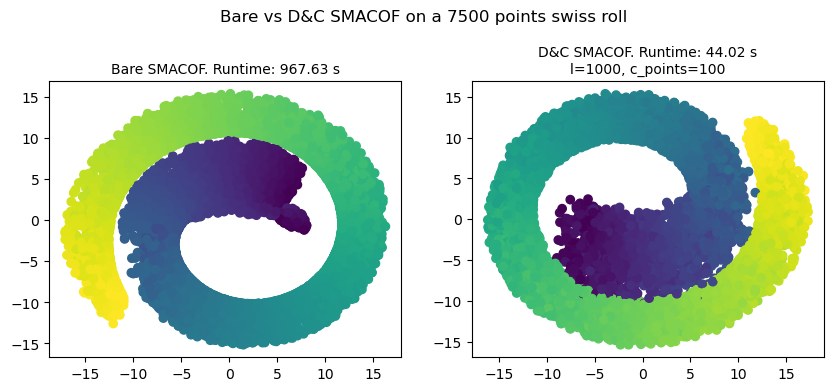

In [33]:
fig = plt.figure(figsize=(10, 4))
fig.suptitle(f'Bare vs D&C SMACOF on a {n} points swiss roll')
fig.subplots_adjust(top=0.8)

ax1 = fig.add_subplot(121)
ax1.scatter(embedding_bare[:, 0], embedding_bare[:, 1], c=color)
ax1.set_title(f'Bare SMACOF. Runtime: {time_bare:.2f} s', fontsize=10)

ax2 = fig.add_subplot(122)
ax2.scatter(embedding_dc[:, 0], embedding_dc[:, 1], c=color)
ax2.set_title(
    f'D&C SMACOF. Runtime: {time_dc:.2f} s\nl={l}, c_points={c_points}', fontsize=10);

In [35]:
time_bare/time_dc

21.981496616697704

To conclude, even though the SMACOF algorithm is not capable to properly embedd the swiss roll, we can see a clear advantage in using it with our D&C approach. Indeed, D&C is about 22x faster than the bare method and the embedding obtained is very similar for all number of datapoints. The only visual differences are noisier edges and wider shapes in the D&C embedding.

Finally, bare SMACOF is not capable of embedding a 10000 points swiss roll on a system with 16 GB of RAM and takes about 17 min to embed a swiss roll of 75000 points. On the other hand, D&C can easily and performantly handle larger datasets.

# 2. MNIST

## 2.1 Until the 24th of April

In [25]:
# Load all_data.RData
rdata = pyreadr.read_r(os.path.join(project_root, 'd_and_c', 'MNIST.RData'))

all_data_pixels = rdata["all_data_pixels"]
target = rdata["target"]
type_data = rdata["type_data"]

target = np.squeeze(np.array(target))
type_data = np.squeeze(np.array(type_data))

# Select train images of numbers
numeric_target = pd.to_numeric(target, errors="coerce")
train_idx = (type_data == "train") & (pd.notnull(numeric_target))

MNIST_pixels = all_data_pixels.loc[train_idx].values
MNIST_target = numeric_target[train_idx]

print(f"MNIST_pixels shape: {MNIST_pixels.shape}")
print(f"MNIST_target shape: {MNIST_target.shape}")

MNIST_pixels shape: (345035, 784)
MNIST_target shape: (345035,)


In [4]:
# Split data into two equally sized partitions
n_images = MNIST_target.shape[0]
shuffled_indices = np.random.permutation(n_images)
partitions_idx = np.array_split(shuffled_indices, 2)

MNIST_pixels1 = MNIST_pixels[partitions_idx[0], :]
MNIST_target1 = MNIST_target[partitions_idx[0]]

MNIST_pixels2 = MNIST_pixels[partitions_idx[1], :]
MNIST_target2 = MNIST_target[partitions_idx[1]]

print(
    f"Partition 1 pixels shape: {MNIST_pixels1.shape}, targets shape: {MNIST_target1.shape}")
print(
    f"Partition 2 pixels shape: {MNIST_pixels2.shape}, targets shape: {MNIST_target2.shape}")

Partition 1 pixels shape: (172518, 784), targets shape: (172518,)
Partition 2 pixels shape: (172517, 784), targets shape: (172517,)


In [ ]:
MNIST_bare1, time_MNIST_bare1 = benchmark(mds_smacof,
                                          MNIST_pixels1, r=2, verbose=2)

After trying to run bare SMACOF on the whole partition 1 (with 172518 images) for 12 min, we stopped its execution because no message was being printed (which might mean that the Kernel would eventually crash). Next, we try with a subpartition of 5000 images, since that worked properly with the swiss roll.

In [5]:
n = 5000
sampled_indices = np.random.choice(
    n_images, size=n, replace=False)
sampled_pixels1 = MNIST_pixels[sampled_indices, :]
sampled_target1 = MNIST_target[sampled_indices]

print("Sampled MNIST_pixels1 shape:", sampled_pixels1.shape)
print("Sampled MNIST_target1 shape:", sampled_target1.shape)

Sampled MNIST_pixels1 shape: (5000, 784)
Sampled MNIST_target1 shape: (5000,)


In [53]:
# Save sampled subset
with open(os.path.join(project_root, 'd_and_c', 'MNIST_5000.pkl'), "wb") as f:
    pickle.dump({"pixels": sampled_pixels1, "target": sampled_target1},
                f)

In [6]:
MNIST_bare1, time_MNIST_bare1 = benchmark(mds_smacof,
                                          sampled_pixels1, r=2, verbose=2)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 0, stress 100489898407644.3
it: 0, stress 100489909221692.53
it: 0, stress 100490066446762.56
it: 0, stress 100489890874008.38
it: 0, stress 100490137513581.7
it: 0, stress 100489921484477.92
it: 0, stress 100489899178278.94
it: 0, stress 100489697834744.6
it: 1, stress 18931422193672.504
it: 1, stress 18980384064373.64
it: 1, stress 18927547318194.156
it: 1, stress 18975857275765.51
it: 1, stress 18934280258866.92
it: 1, stress 18981631491495.875
it: 1, stress 18973265347898.992
it: 1, stress 18944312425749.203
it: 2, stress 18394573125390.832
it: 2, stress 18425394529737.52
it: 2, stress 18384559191597.355
it: 2, stress 18419029111742.164
it: 2, stress 18386603340439.254
it: 2, stress 18419237319314.016
it: 2, stress 18412523493162.305
it: 2, stress 18376500082395.746
it: 3, stress 17991140818606.723
it: 3, stress 18018694428889.94
it: 3, stress 17984393581789.31
it: 3, stress 17985028652522.805
it: 3, stress 17997639374120.035
it: 3, stress 18005616243579.125
it: 3, stress 17990

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:  3.5min remaining: 10.5min


it: 299, stress 12843887915704.088
it: 299, stress 12876147398724.53
it: 299, stress 12835434101217.71
it: 299, stress 12870160949224.54
it: 299, stress 13422205628550.896
it: 299, stress 12858740246636.215


[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:  3.5min finished


In [ ]:
# Save experiment results
with open(os.path.join(pickle_path, "MNIST_5000_SMACOF.pkl"), "wb") as f:
    pickle.dump({"embedding": MNIST_bare1, "runtime": time_MNIST_bare1},
                f)

As with the swiss roll dataset, MNIST with 5000 points was reached the system's limitations.

Let us apply D&C now.

In [9]:
l, c_points = 1000, 100

In [ ]:

MNIST_dc1, time_MNIST_dc1 = benchmark(divide_conquer,
                                      DRMethod.SMACOF, sampled_pixels1, l=l, c_points=c_points, r=2, verbose=2)

Projecting partition 1...
it: 0, stress 4011986140976.8916
it: 0, stress 4012012244967.0166
it: 0, stress 4011946985253.6567
it: 0, stress 4012002102910.6567
it: 1, stress 751662107110.775
it: 0, stress 4012001620912.7607
it: 0, stress 4012007239495.533
it: 1, stress 752962077224.1578
it: 1, stress 753192035168.3932
it: 2, stress 730250627402.6498
it: 1, stress 757237912855.9406
it: 1, stress 753837484191.0806


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 2, stress 731492763783.2396
it: 0, stress 4011993946569.4795
it: 1, stress 755493801153.904
it: 2, stress 731073465863.3058
it: 0, stress 4012014438843.742
it: 3, stress 714366767495.9485
it: 3, stress 716354860961.8135
it: 2, stress 733639583047.9396
it: 2, stress 735777359366.6151
it: 2, stress 735222338941.0989
it: 3, stress 714710041185.9148
it: 1, stress 756834072062.0575
it: 4, stress 702150670575.9757
it: 1, stress 752055635567.8362
it: 4, stress 704717890413.3442
it: 3, stress 718491926200.4071
it: 3, stress 720117850567.2397
it: 2, stress 735551026369.5042
it: 5, stress 692387739356.5741
it: 3, stress 720371378260.4475
it: 4, stress 702027899869.788
it: 5, stress 695219623294.1039
it: 2, stress 729177783087.3386
it: 4, stress 707641881606.6404
it: 4, stress 708423105211.2357
it: 4, stress 706046474248.8534
it: 3, stress 720009060093.9294
it: 6, stress 684674057762.8798
it: 5, stress 697341218237.938
it: 5, stress 692103337331.6918
it: 5, stress 695632100556.6581
it: 3, str

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    7.1s remaining:   21.3s


it: 297, stress 521116550537.7263
it: 290, stress 515276577958.24817
it: 292, stress 534236933260.3708
it: 289, stress 507893851400.46106
it: 293, stress 513430235523.1821
it: 297, stress 538916174107.21533
it: 298, stress 521006709846.6301
it: 293, stress 534194842249.06445
it: 291, stress 515175130292.0341
it: 294, stress 513290486962.4319
it: 290, stress 507848375540.8816
it: 299, stress 520895382335.41766
it: 298, stress 538796726981.8424
it: 294, stress 534153652620.0362
it: 292, stress 515074281737.48376
it: 295, stress 513153866911.24603
it: 291, stress 507803889717.48175
it: 299, stress 538679217887.0131
it: 295, stress 534112996719.2418
it: 293, stress 514973366180.6827
it: 292, stress 507760877560.1313
it: 296, stress 513022074931.3449
it: 296, stress 534072678089.0241
it: 294, stress 514873870587.98
it: 297, stress 512893462662.0191
it: 293, stress 507719054542.02386
it: 295, stress 514776109168.78845
it: 297, stress 534032473647.5785
it: 298, stress 512768041736.59924
it: 2

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    7.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 0, stress 3290228155356.01
it: 0, stress 3290219937599.286
it: 0, stress 3290228525068.355
it: 0, stress 3290233725041.134
it: 1, stress 617733340741.4353
it: 0, stress 3290215577455.2476
it: 1, stress 613199779558.7856
it: 2, stress 599091230016.1144
it: 0, stress 3290236470748.569
it: 1, stress 623683702840.2043
it: 1, stress 620093766633.6139
it: 1, stress 620636195458.3452
it: 1, stress 619508670844.4309
it: 2, stress 602726321121.1698
it: 3, stress 585583028231.0758
it: 2, stress 595508665876.6217
it: 3, stress 589327489031.5681
it: 2, stress 605614046462.065
it: 2, stress 602469666029.4344
it: 2, stress 601913419740.9839
it: 4, stress 578351868293.2195
it: 3, stress 582759863880.2727
it: 3, stress 592163177773.1669
it: 4, stress 575371073578.4744
it: 5, stress 569358170178.8624
it: 3, stress 589138479778.999
it: 3, stress 589355654498.6362
it: 4, stress 581313450794.5945
it: 5, stress 567082766377.9779
it: 4, stress 572985086376.1683
it: 6, stress 562033437410.3162
it: 4, str

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    5.3s remaining:   16.0s


it: 200, stress 435008942745.56525
it: 200, stress 454706080073.9743
it: 201, stress 434851081115.94543
it: 201, stress 454557241213.29846
it: 202, stress 434696666443.68585
it: 202, stress 454411673623.70544
it: 203, stress 434545875828.527
it: 203, stress 454268835222.41895
it: 204, stress 454129534503.97577
it: 204, stress 434399481210.42163
it: 205, stress 453995048003.10236
it: 205, stress 434256072291.73444
it: 206, stress 453863201680.60364
it: 206, stress 434113358767.56165
it: 207, stress 453733736546.82965
it: 207, stress 433973699843.26776
it: 208, stress 453607285214.84106
it: 208, stress 433837479316.774
it: 209, stress 453483253274.5687
it: 209, stress 433706015937.3225
it: 210, stress 453361249977.1684
it: 210, stress 433577436470.1634
it: 211, stress 433453090981.24384
it: 211, stress 453240510110.60077
it: 212, stress 433331472323.44434
it: 212, stress 453121286678.2835
it: 213, stress 433212471098.94006
it: 213, stress 453003336109.3952
it: 214, stress 433095296711.60

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    6.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 0, stress 3235523715121.141
it: 0, stress 3235500746487.11
it: 0, stress 3235492692669.586
it: 0, stress 3235524062832.023
it: 0, stress 3235524439176.5244
it: 1, stress 609164783505.9084
it: 1, stress 604851784405.1377
it: 1, stress 610212414615.9597
it: 2, stress 592382583746.3057
it: 1, stress 612113310005.4652
it: 2, stress 590789321212.1039
it: 2, stress 587924830097.2584
it: 1, stress 606538556198.7987
it: 3, stress 577455171399.6816
it: 2, stress 594304110350.0046
it: 3, stress 575405186971.0394
it: 4, stress 567438742912.7108
it: 3, stress 579462023218.7136
it: 2, stress 589165136753.431
it: 5, stress 559763359286.2599
it: 4, stress 565751954861.5325
it: 4, stress 569379005858.9678
it: 3, stress 576630165586.9663
it: 3, stress 581097233871.0042
it: 5, stress 557908884787.1427
it: 4, stress 570431680279.012
it: 6, stress 553684391780.5394
it: 6, stress 551462375812.7014
it: 4, stress 566657993759.7542
it: 5, stress 561256010016.7992
it: 5, stress 561815126537.2372
it: 7, str

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    5.0s remaining:   15.1s


it: 185, stress 441462554051.20905
it: 194, stress 441102058054.3616
it: 203, stress 432793150795.7363
it: 186, stress 441324738886.7975
it: 195, stress 440968705161.2792
it: 204, stress 432475179174.36414
it: 187, stress 441189519431.63306
it: 196, stress 440835884289.34204
it: 205, stress 432159404912.22363
it: 188, stress 441056213395.42914
it: 197, stress 440703670773.2009
it: 206, stress 431845679132.37787
it: 189, stress 440924955981.2845
it: 198, stress 440571676510.2582
it: 207, stress 431536841663.0525
it: 190, stress 440794487247.9171
it: 208, stress 431232524625.04584
it: 199, stress 440441089376.2932
it: 191, stress 440667512388.9593
it: 209, stress 430934772130.31445
it: 200, stress 440311614556.7689
it: 192, stress 440544152400.69366
it: 210, stress 430643898651.26953it: 201, stress 440183972289.08014

it: 193, stress 440422469566.9863
it: 202, stress 440058497473.0346
it: 211, stress 430359339129.2702
it: 194, stress 440300204032.15283
it: 212, stress 430082341732.3381
i

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    6.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 0, stress 3260580556955.5176
it: 0, stress 3260611173164.0537
it: 0, stress 3260586183902.469
it: 0, stress 3260594473432.173
it: 1, stress 612280496184.5548
it: 0, stress 3260613586650.3574
it: 1, stress 609499970745.1443
it: 1, stress 610817708083.1272
it: 1, stress 613617312747.8093
it: 2, stress 594853123573.1659
it: 0, stress 3260594463009.424
it: 0, stress 3260620791195.705
it: 2, stress 595355263935.467
it: 1, stress 612358955314.6099
it: 3, stress 582043169511.8647
it: 1, stress 615067420016.8728
it: 2, stress 594610981078.112
it: 2, stress 592662385209.3203
it: 2, stress 591955133595.7415
it: 4, stress 572213360293.1136
it: 3, stress 582303102819.2301
it: 1, stress 610999979584.3876
it: 5, stress 564514907940.8328
it: 2, stress 596791996951.436
it: 3, stress 578997317065.4049
it: 2, stress 593936228595.9835
it: 3, stress 579436158984.5599
it: 3, stress 581665777360.2838
it: 4, stress 572090653523.0369
it: 4, stress 568350771932.6567
it: 6, stress 558443307006.003
it: 3, st

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    5.4s remaining:   16.2s


it: 299, stress 423447007945.2622
it: 194, stress 451424705906.3447
it: 195, stress 451168119069.9205
it: 196, stress 450915426138.8143
it: 197, stress 450667439278.9253
it: 198, stress 450422714370.33795
it: 199, stress 450179801463.38226
it: 200, stress 449938881517.1874
it: 201, stress 449699587253.87
it: 202, stress 449464655032.1289
it: 203, stress 449233764544.3735
it: 204, stress 449008259423.23065
it: 205, stress 448788255172.5108
it: 206, stress 448571506684.82
it: 207, stress 448357792594.79285
it: 208, stress 448145090491.4465
it: 209, stress 447935994885.8091
it: 210, stress 447727964537.22723
it: 211, stress 447518012143.0982
it: 212, stress 447306533216.8479
it: 213, stress 447093066264.024
it: 214, stress 446880746372.78564
it: 215, stress 446669259806.6873
it: 216, stress 446458636751.3185
it: 217, stress 446245516532.5037
it: 218, stress 446028982025.2307
it: 219, stress 445811907347.473
it: 220, stress 445593457941.66815
it: 221, stress 445369091655.0289
it: 222, stre

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    6.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 0, stress 3246137414147.4604it: 0, stress 3246150555179.894

it: 0, stress 3246163140573.5127
it: 1, stress 610659407746.8057
it: 0, stress 3246143817207.1543
it: 1, stress 613551626367.1647
it: 0, stress 3246159126641.0156
it: 1, stress 608506883628.0831
it: 2, stress 592860735241.5204
it: 2, stress 591467579562.4009
it: 0, stress 3246158286273.051
it: 3, stress 579655883393.5016
it: 1, stress 611698309254.1191
it: 1, stress 612796396002.257
it: 1, stress 616092118463.3268
it: 2, stress 595150809757.4794
it: 3, stress 578901674660.7432
it: 2, stress 593071707210.6912
it: 0, stress 3246134851448.254
it: 2, stress 595094129315.7882
it: 2, stress 597334324551.5712
it: 4, stress 568637782308.0378
it: 4, stress 569274962746.8918
it: 3, stress 581982836237.2555
it: 1, stress 613678101811.3849
it: 3, stress 583480244492.1809
it: 5, stress 560192336624.7708
it: 5, stress 561016828262.8832
it: 3, stress 579337548613.2117
it: 3, stress 581755824286.9287
it: 4, stress 571686457923.5194
it: 6

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    5.5s remaining:   16.6s


it: 206, stress 438965921967.8986
it: 207, stress 438798306659.8085
it: 208, stress 438628487554.0748
it: 209, stress 438457799502.1657
it: 210, stress 438285367217.64166
it: 211, stress 438111953738.1982
it: 212, stress 437938742701.15576
it: 213, stress 437766440887.7193
it: 214, stress 437593947686.67206
it: 215, stress 437421964033.2302
it: 216, stress 437248655264.35065
it: 217, stress 437074460277.50195
it: 218, stress 436897607275.9653
it: 219, stress 436719500277.6387
it: 220, stress 436540787766.9481
it: 221, stress 436364514524.6102
it: 222, stress 436192914712.941
it: 223, stress 436022121651.0776
it: 224, stress 435852913410.42017
it: 225, stress 435683174432.8459
it: 226, stress 435511364068.84283
it: 227, stress 435337754400.0555
it: 228, stress 435161850046.9598
it: 229, stress 434983135066.05493
it: 230, stress 434806138340.19275
it: 231, stress 434634885763.33875
it: 232, stress 434468362468.19
it: 233, stress 434302264003.8459
it: 234, stress 434138683627.30255
it: 23

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    6.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 0, stress 3195771218392.8154
it: 0, stress 3195773390029.0825
it: 1, stress 605971224525.8435
it: 0, stress 3195791566698.5225
it: 1, stress 604860666976.9666
it: 1, stress 602300990266.7625
it: 0, stress 3195803415360.2983
it: 2, stress 586201068327.444
it: 2, stress 585710980229.9725
it: 3, stress 571122189377.4408
it: 1, stress 604236973019.3588
it: 2, stress 583359652349.9287
it: 3, stress 571385295017.4089
it: 0, stress 3195789176287.64
it: 4, stress 559662287611.8912
it: 4, stress 560429734351.5867
it: 1, stress 600154569982.7202
it: 0, stress 3195795553786.843
it: 3, stress 569445265307.0433
it: 2, stress 585305331566.8945
it: 0, stress 3195792991487.0674
it: 4, stress 558640088239.8083it: 3, stress 571160398117.226

it: 2, stress 581558280001.4406
it: 5, stress 550783171566.7738
it: 5, stress 551572085551.3517
it: 1, stress 602002907621.0442
it: 1, stress 600617241784.7948
it: 5, stress 550177858126.7747
it: 6, stress 543581057884.9944
it: 4, stress 560264749209.4724
it: 2,

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    5.4s remaining:   16.2s


it: 212, stress 441849420324.3008
it: 213, stress 441740209014.9423
it: 214, stress 441632625305.32623
it: 215, stress 441525576567.8992
it: 216, stress 441421130444.7795
it: 217, stress 441319354388.0069
it: 218, stress 441219591429.8362
it: 219, stress 441120079758.48
it: 220, stress 441020797698.66406
it: 221, stress 440922336683.81775
it: 222, stress 440825246926.508
it: 223, stress 440729235568.50287
it: 224, stress 440632589663.88464
it: 225, stress 440535984750.0601
it: 226, stress 440440569595.7864
it: 227, stress 440345615605.4163
it: 228, stress 440251113477.70386
it: 229, stress 440156726108.878
it: 230, stress 440060237277.1613
it: 231, stress 439963114815.1134
it: 232, stress 439865802154.4734
it: 233, stress 439769488325.12244
it: 234, stress 439673649172.23425
it: 235, stress 439579249745.8494
it: 236, stress 439487619611.48914
it: 237, stress 439399339110.7513
it: 238, stress 439311788099.6639
it: 239, stress 439226141695.04926
it: 240, stress 439140666671.0509
it: 241,

[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    6.0s finished


In [ ]:
# Save experiment results
with open(os.path.join(pickle_path, "MNIST_5000_DC_SMACOF.pkl"), "wb") as f:
    pickle.dump({"embedding": MNIST_dc1, "runtime": time_MNIST_dc1},
                f)

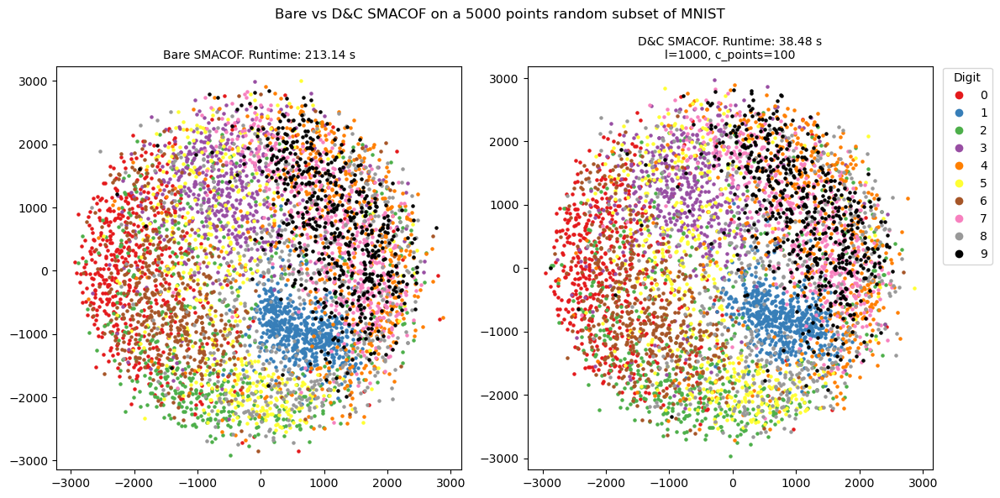

In [ ]:
# Load the embeddings and runtimes from the pickle files
with open(os.path.join(pickle_path, "MNIST_5000_SMACOF.pkl"), "rb") as f:
    bare_data = pickle.load(f)
    MNIST_bare1 = bare_data["embedding"]
    time_MNIST_bare1 = bare_data["runtime"]

with open(os.path.join(pickle_path, "MNIST_5000_DC_SMACOF.pkl"), "rb") as f:
    dc_data = pickle.load(f)
    MNIST_dc1 = dc_data["embedding"]
    time_MNIST_dc1 = dc_data["runtime"]

# Change sign to align 1st coordinates of both methods
MNIST_dc1[:, 0] = - MNIST_dc1[:, 0]

# Plot the embedding
digits = np.unique(MNIST_target)

set1_colors = list(plt.get_cmap('Set1').colors)
set1_colors.append((0, 0, 0))  # Add black as RGB tuple
cmap = mcolors.ListedColormap(set1_colors)

# Create custom legend handles with larger markers
legend_handles = [mlines.Line2D([], [], linestyle='None', marker='o',
                                markersize=7,
                                markerfacecolor=cmap(i),
                                markeredgewidth=0,
                                label=int(digit))
                  for i, digit in enumerate(digits)]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
# Partition 1
for i, digit in enumerate(digits):
    mask = sampled_target1 == digit
    ax1.scatter(MNIST_bare1[mask, 0], MNIST_bare1[mask, 1],
                color=cmap(i),
                label=int(digit),
                s=5)
ax1.set_title(f'Bare SMACOF. Runtime: {time_MNIST_bare1:.2f} s', fontsize=10)
ax1.axis('equal')

# Partition 2
for i, digit in enumerate(digits):
    mask = sampled_target1 == digit
    ax2.scatter(MNIST_dc1[mask, 0], MNIST_dc1[mask, 1],
                color=cmap(i),
                s=5)
ax2.set_title(
    f'D&C SMACOF. Runtime: {time_MNIST_dc1:.2f} s\nl={l}, c_points={c_points}', fontsize=10)
ax2.axis('equal')
ax2.legend(handles=legend_handles, title="Digit",
           bbox_to_anchor=(1.01, 1.01), loc='upper left')

fig.suptitle(f'Bare vs D&C SMACOF on a {n} points random subset of MNIST')
plt.tight_layout()
plt.show()

We can observe that both bare and D&C SMACOF produce very bad embeddings where digits are very badly classified. However, let us plot each dimension against itself with different methods.

In [3]:
n, l, c_points = 5000, 1000, 100

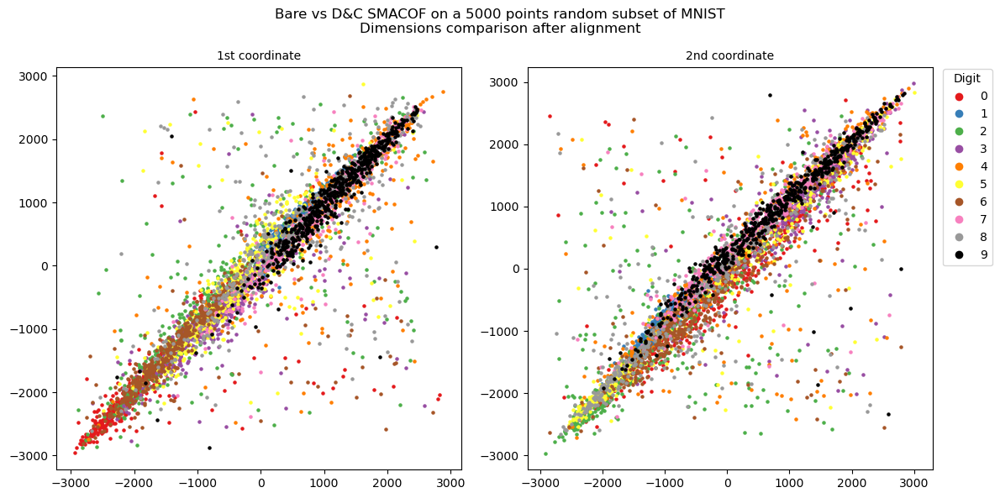

In [ ]:
# Load the embeddings and runtimes from the pickle files
with open(os.path.join(project_root, 'd_and_c', 'MNIST_5000.pkl'), "rb") as f:
    bare_data = pickle.load(f)
    sampled_pixels1 = bare_data["pixels"]
    sampled_target1 = bare_data["target"]

with open(os.path.join(pickle_path, "MNIST_5000_SMACOF.pkl"), "rb") as f:
    bare_data = pickle.load(f)
    MNIST_bare1 = bare_data["embedding"]
    time_MNIST_bare1 = bare_data["runtime"]

with open(os.path.join(pickle_path, "MNIST_5000_DC_SMACOF.pkl"), "rb") as f:
    dc_data = pickle.load(f)
    MNIST_dc1 = dc_data["embedding"]
    time_MNIST_dc1 = dc_data["runtime"]

# Change sign to align 1st coordinates of both methods
MNIST_dc1[:,0] = - MNIST_dc1[:,0]

# Plot the embedding
digits = np.unique(sampled_target1)

set1_colors = list(plt.get_cmap('Set1').colors)
set1_colors.append((0, 0, 0))  # Add black as RGB tuple
cmap = mcolors.ListedColormap(set1_colors)

# Create custom legend handles with larger markers
legend_handles = [mlines.Line2D([], [], linestyle='None', marker='o',
                                markersize=7,
                                markerfacecolor=cmap(i),
                                markeredgewidth=0,
                                label=int(digit))
                  for i, digit in enumerate(digits)]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
# Partition 1
for i, digit in enumerate(digits):
    mask = sampled_target1 == digit
    ax1.scatter(MNIST_bare1[mask, 0], MNIST_dc1[mask, 0],
                color=cmap(i),
                label=int(digit),
                s=5)
ax1.set_title('1st coordinate', fontsize=10)
ax1.axis('equal')

# Partition 2
for i, digit in enumerate(digits):
    mask = sampled_target1 == digit
    ax2.scatter(MNIST_bare1[mask, 1], MNIST_dc1[mask, 1],
                color=cmap(i),
                s=5)
ax2.set_title(
    f'2nd coordinate', fontsize=10)
ax2.axis('equal')
ax2.legend(handles=legend_handles, title="Digit",
           bbox_to_anchor=(1.01, 1.01), loc='upper left')

fig.suptitle(f'Bare vs D&C SMACOF on a {n} points random subset of MNIST\nDimensions comparison after alignment')
plt.tight_layout()
plt.show()

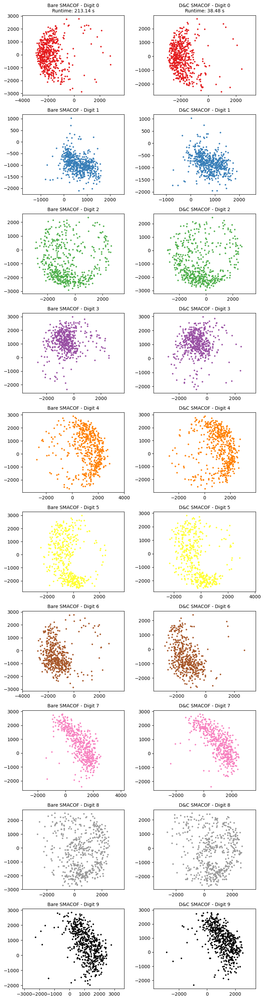

In [ ]:
# Load embeddings
with open(os.path.join(pickle_path, "MNIST_5000_SMACOF.pkl"), "rb") as f:
    bare_data = pickle.load(f)
    MNIST_bare1 = bare_data["embedding"]
    time_MNIST_bare1 = bare_data["runtime"]

with open(os.path.join(pickle_path, "MNIST_5000_DC_SMACOF.pkl"), "rb") as f:
    dc_data = pickle.load(f)
    MNIST_dc1 = dc_data["embedding"]
    time_MNIST_dc1 = dc_data["runtime"]

# Change sign to align 1st coordinates of both methods
MNIST_dc1[:, 0] = - MNIST_dc1[:, 0]

digits = np.unique(sampled_target1)

set1_colors = list(plt.get_cmap('Set1').colors)
set1_colors.append((0, 0, 0))  # Add black as RGB tuple
cmap = mcolors.ListedColormap(set1_colors)

# Create a 10x2 grid: one row per digit, columns for Bare and D&C
fig, axes = plt.subplots(len(digits), 2, figsize=(8, 30))
method_data = [
    ("Bare SMACOF", MNIST_bare1, time_MNIST_bare1),
    ("D&C SMACOF", MNIST_dc1, time_MNIST_dc1)
]

for row, digit in enumerate(digits):
    for col, (method_name, embedding, runtime) in enumerate(method_data):
        mask = sampled_target1 == digit
        ax = axes[row, col]
        ax.scatter(embedding[mask, 0], embedding[mask, 1],
                   color=cmap(row), s=5)
        if row == 0:
            ax.set_title(
                f"{method_name} - Digit {int(digit)}\nRuntime: {runtime:.2f} s", fontsize=10)
        else:
            ax.set_title(f"{method_name} - Digit {int(digit)}", fontsize=10)
        ax.axis('equal')
plt.tight_layout()
plt.show()

Next, we will apply a Procrustes transformation to digits 1-9 in order to align them with digit 0's embedding.

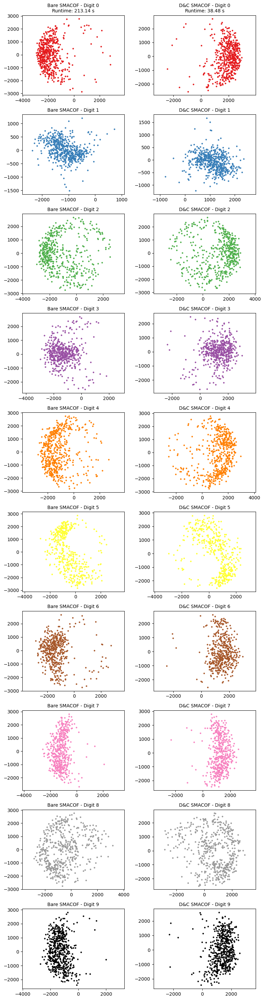

In [ ]:
digits = np.unique(sampled_target1)

set1_colors = list(plt.get_cmap('Set1').colors)
set1_colors.append((0, 0, 0))  # Add black as RGB tuple
cmap = mcolors.ListedColormap(set1_colors)


# Obtain target matrix to apply Procrustes transformation
digit_0 = MNIST_bare1[sampled_target1 == 0]
n_rows_target = digit_0.shape[0]

n_rows_digits = [MNIST_bare1[sampled_target1==digit].shape[0] for digit in digits]
c_points = min(n_rows_digits)

sampled_idx = np.random.choice(n_rows_target, size=c_points, replace=False)
target = digit_0[sampled_idx, :]

# Create a 10x2 grid: one row per digit, columns for Bare and D&C
fig, axes = plt.subplots(len(digits), 2, figsize=(8, 30))
method_data = [
    ("Bare SMACOF", MNIST_bare1, time_MNIST_bare1),
    ("D&C SMACOF", MNIST_dc1, time_MNIST_dc1)
]

for col, (method_name, embedding, runtime) in enumerate(method_data):
    # Obtain target matrix to apply Procrustes transformation
    digit_0 = embedding[sampled_target1 == 0]
    n_rows_target = digit_0.shape[0]

    n_rows_digits = [embedding[sampled_target1==digit].shape[0] for digit in digits]
    c_points = min(n_rows_digits)

    sampled_idx = np.random.choice(n_rows_target, size=c_points, replace=False)
    target = digit_0[sampled_idx, :]

    # Plot digit embeddings
    for row, digit in enumerate(digits):
        x = embedding[sampled_target1 == digit]
        ax = axes[row, col]
        if row == 0:
            ax.scatter(x[:,0], x[:, 1],
                       color=cmap(row), s=5)
            ax.set_title(
                f"{method_name} - Digit {int(digit)}\nRuntime: {runtime:.2f} s", fontsize=10)
        else:
            # Align x to y using perform_procrustes
            x_aligned = perform_procrustes(x[:c_points,:], target, x)
            ax.scatter(x_aligned[:,0], x_aligned[:,1],
                   color=cmap(row), s=5)
            ax.set_title(f"{method_name} - Digit {int(digit)}", fontsize=10)
        ax.axis('equal')
plt.tight_layout()
plt.show()

We can try to improve the result by increasing the maximum number of iterations and the number of different initializations used.

In [28]:
# Increase n_init (default=8)
MNIST_bare2, time_MNIST_bare2 = benchmark(mds_smacof,
                                          sampled_pixels1, r=2, verbose=2,
                                          n_init=16)
# Increase max_iter (default=300)
MNIST_bare3, time_MNIST_bare3 = benchmark(mds_smacof,
                                          sampled_pixels1, r=2, verbose=2,
                                          max_iter = 1000)
# Increase n_init and max_iter
MNIST_bare4, time_MNIST_bare4 = benchmark(mds_smacof,
                                          sampled_pixels1, r=2, verbose=2,
                                          n_init=16,
                                          max_iter=1000)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 0, stress 100489921484477.92
it: 0, stress 100490066446762.56
it: 0, stress 100489899178278.94
it: 0, stress 100489697834744.6
it: 0, stress 100489898407644.3
it: 0, stress 100489909221692.53
it: 0, stress 100489890874008.38
it: 0, stress 100490137513581.7
it: 1, stress 18981631491495.875
it: 1, stress 18944312425749.203
it: 1, stress 18975857275765.51
it: 2, stress 18419237319314.016
it: 1, stress 18927547318194.156
it: 1, stress 18934280258866.92
it: 1, stress 18980384064373.64
it: 1, stress 18931422193672.504
it: 1, stress 18973265347898.992
it: 2, stress 18376500082395.746
it: 2, stress 18419029111742.164
it: 3, stress 18005616243579.125
it: 2, stress 18386603340439.254
it: 2, stress 18384559191597.355
it: 2, stress 18425394529737.52
it: 2, stress 18394573125390.832
it: 2, stress 18412523493162.305
it: 3, stress 17997639374120.035
it: 3, stress 17956101565224.844
it: 4, stress 17684659830553.95
it: 3, stress 17984393581789.31
it: 3, stress 17990902614149.605
it: 3, stress 17985

[Parallel(n_jobs=-1)]: Done  16 out of  16 | elapsed: 17.5min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 0, stress 100490032221858.55
it: 0, stress 100489784528050.81
it: 0, stress 100490034816433.14
it: 0, stress 100489673480026.2
it: 0, stress 100489728632730.92
it: 0, stress 100489724172720.47
it: 0, stress 100490081947859.61
it: 0, stress 100489663357002.33
it: 1, stress 18916040140285.508
it: 1, stress 18893692009986.715
it: 1, stress 18940302639255.617
it: 1, stress 18984884305884.934
it: 1, stress 18912490685486.2
it: 1, stress 18993802956020.004
it: 1, stress 18991304147051.348
it: 1, stress 18885014035608.902
it: 2, stress 18354274231381.85
it: 2, stress 18341706383221.047
it: 2, stress 18337812013253.688
it: 2, stress 18368559314810.02
it: 2, stress 18381030918419.57
it: 2, stress 18434797540919.98
it: 2, stress 18434377259145.72
it: 2, stress 18437372532294.92
it: 3, stress 17946677108964.508
it: 3, stress 17934949282263.07
it: 3, stress 17968437732630.695
it: 3, stress 17969471925038.758
it: 3, stress 18023304287036.06
it: 3, stress 18018955737710.812
it: 3, stress 1792911

[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed: 23.4min remaining: 70.1min


it: 997, stress 12660156965176.17
it: 997, stress 12697107785962.303
it: 997, stress 12665395454595.326
it: 993, stress 12665660248800.023
it: 999, stress 12658869406687.25
it: 999, stress 12730844549328.156
it: 998, stress 12660122690439.213
it: 998, stress 12665391436017.004
it: 998, stress 12697013362000.447
it: 994, stress 12665642260983.21
it: 999, stress 12660090248661.037
it: 999, stress 12665387540596.484
it: 999, stress 12696919304850.002
it: 995, stress 12665624855642.459
it: 996, stress 12665607525439.02
it: 997, stress 12665590609909.307
it: 998, stress 12665574271735.07
it: 999, stress 12665558420946.064


[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed: 23.4min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


it: 0, stress 100490054669526.25
it: 0, stress 100489989428198.47
it: 0, stress 100489968796499.77
it: 0, stress 100490050015865.92
it: 0, stress 100489951466478.55
it: 0, stress 100490032320719.66
it: 0, stress 100489814966839.92
it: 0, stress 100489981254274.66
it: 1, stress 18951293116862.13
it: 1, stress 18864227600287.215
it: 1, stress 18970896192649.543
it: 1, stress 18996502744023.21
it: 1, stress 18956338185169.08
it: 1, stress 18968942691813.48
it: 1, stress 18924004124117.574
it: 1, stress 18978315674578.996
it: 2, stress 18407929045635.184
it: 2, stress 18395351215834.477
it: 2, stress 18410269663144.098
it: 2, stress 18438185733411.73
it: 2, stress 18404996684590.49
it: 2, stress 18420491877793.535
it: 2, stress 18318216320557.207
it: 2, stress 18378709865305.957
it: 3, stress 17985523363180.76
it: 3, stress 17990511836657.74
it: 3, stress 18011336006111.51
it: 3, stress 18024233785596.297
it: 3, stress 18008454726605.89
it: 3, stress 17917739352080.344
it: 3, stress 179896

[Parallel(n_jobs=-1)]: Done  16 out of  16 | elapsed: 54.7min finished


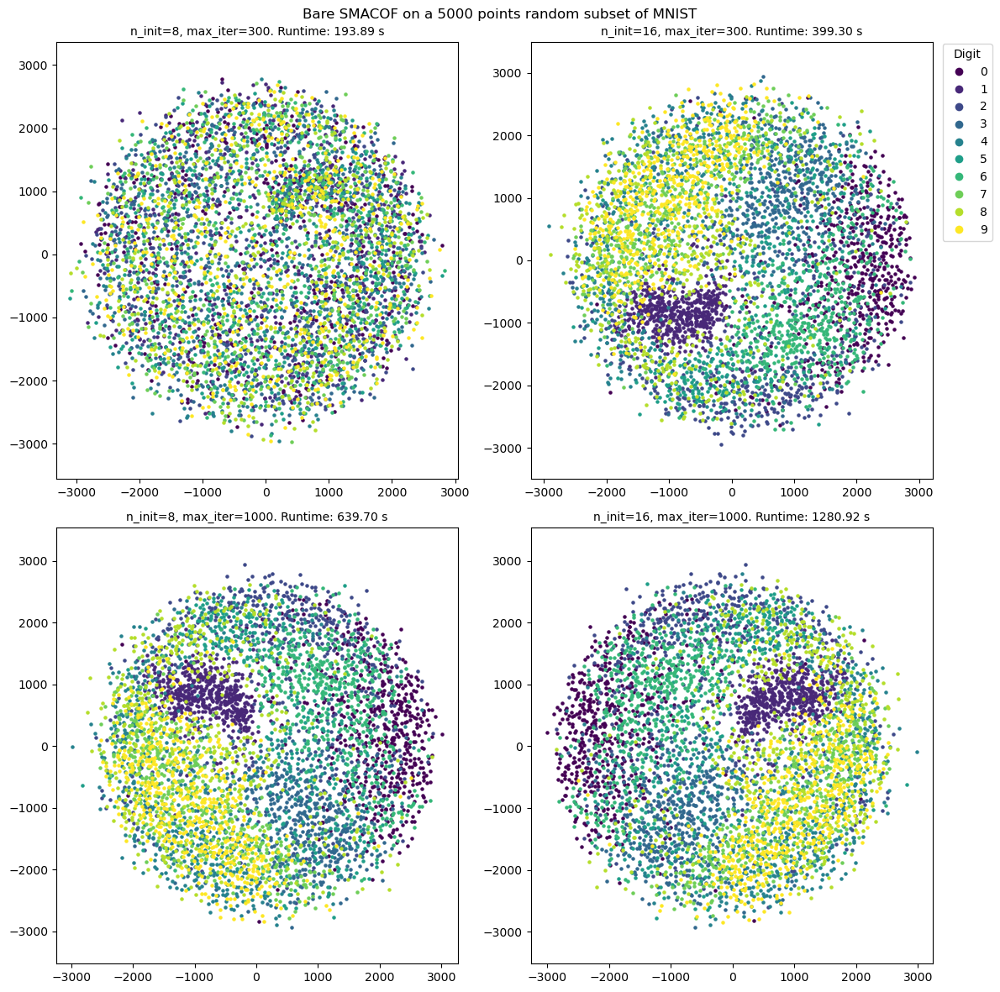

In [30]:
# Plot the embeddings
digits = np.unique(MNIST_target)
cmap = plt.get_cmap('viridis', len(digits))
# Create custom legend handles with larger markers
legend_handles = [mlines.Line2D([], [], linestyle='None', marker='o',
                                markersize=7,
                                markerfacecolor=cmap(i),
                                markeredgewidth=0,
                                label=int(digit))
                  for i, digit in enumerate(digits)]

fig, axes = plt.subplots(2, 2, figsize=(12, 12))
ax1, ax2, ax3, ax4 = axes.flatten()
# Partition 1
for i, digit in enumerate(digits):
    mask = sampled_target1 == digit
    ax1.scatter(MNIST_bare1[mask, 0], MNIST_bare1[mask, 1],
                color=cmap(i),
                label=int(digit),
                s=5)
ax1.set_title(
    f'n_init=8, max_iter=300. Runtime: {time_MNIST_bare1:.2f} s', fontsize=10)
ax1.axis('equal')

# Partition 2
for i, digit in enumerate(digits):
    mask = sampled_target1 == digit
    ax2.scatter(MNIST_bare2[mask, 0], MNIST_bare2[mask, 1],
                color=cmap(i),
                label=int(digit),
                s=5)
ax2.set_title(
    f'n_init=16, max_iter=300. Runtime: {time_MNIST_bare2:.2f} s', fontsize=10)
ax2.axis('equal')

# Partition 3
for i, digit in enumerate(digits):
    mask = sampled_target1 == digit
    ax3.scatter(MNIST_bare3[mask, 0], MNIST_bare3[mask, 1],
                color=cmap(i),
                label=int(digit),
                s=5)
ax3.set_title(
    f'n_init=8, max_iter=1000. Runtime: {time_MNIST_bare3:.2f} s', fontsize=10)
ax3.axis('equal')

# Partition 4
for i, digit in enumerate(digits):
    mask = sampled_target1 == digit
    ax4.scatter(MNIST_bare4[mask, 0], MNIST_bare4[mask, 1],
                color=cmap(i),
                label=int(digit),
                s=5)
ax4.set_title(
    f'n_init=16, max_iter=1000. Runtime: {time_MNIST_bare4:.2f} s', fontsize=10)
ax4.axis('equal')

ax2.legend(handles=legend_handles, title="Digit",
           bbox_to_anchor=(1.01, 1.01), loc='upper left')

fig.suptitle(f'Bare SMACOF on a {n} points random subset of MNIST')
plt.tight_layout()
plt.show()

Increasing both n_init and max_iter improves the embedding, but classes are not well separated yet and the increase caused in runtime is significant.

Let us try now with the whole train set of numbers with D&C SMACOF.

In [28]:
l, c_points = 1000, 100

In [ ]:
MNIST_dc_full1, time_MNIST_dc_full1 = benchmark(divide_conquer,
                                      DRMethod.SMACOF, MNIST_pixels, l=l, c_points=c_points, r=2, verbose=2)
# Save experiment results
with open(os.path.join(pickle_path, "MNIST_train_num_DC_SMACOF.pkl"), "wb") as f:
    pickle.dump({"embedding": MNIST_dc_full1, "runtime": time_MNIST_dc_full1},
                f)

In [23]:
with open(os.path.join(pickle_path, "MNIST_train_num_DC_SMACOF.pkl"), "rb") as f:
    bare_data = pickle.load(f)
    MNIST_dc_full1 = bare_data["embedding"]
    time_MNIST_dc_full1 = bare_data["runtime"]

In [26]:
# Estimate densities
digits = np.unique(MNIST_target)
densities = {}

for digit in digits:
    mask = MNIST_target == digit
    data = MNIST_dc_full1[mask].T
    kde = gaussian_kde(data)
    densities[int(digit)] = kde

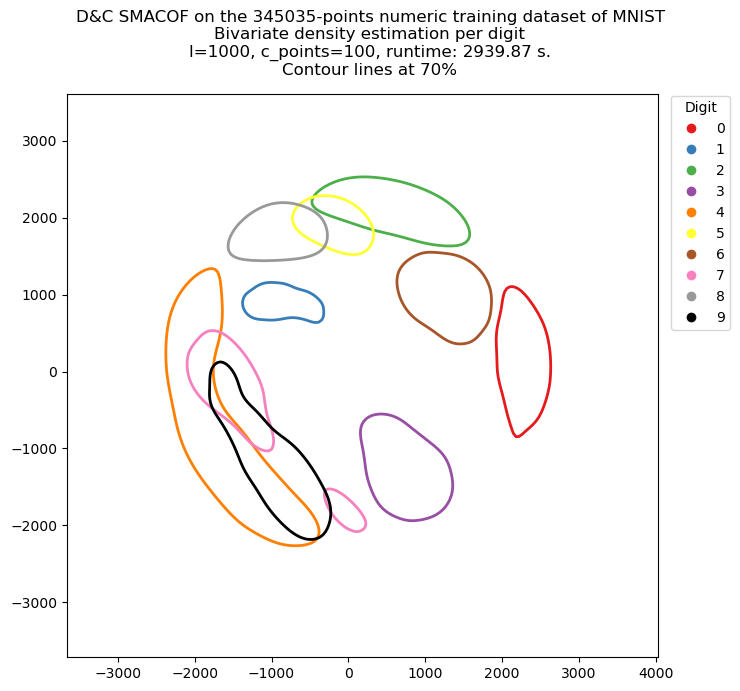

In [29]:
# Contour plot estimated densities
set1_colors = list(plt.get_cmap('Set1').colors)
set1_colors.append((0, 0, 0))  # Add black
cmap = mcolors.ListedColormap(set1_colors)

# Compute meshgrid for contours
embedding_x = MNIST_dc_full1[:,0]
embedding_y = MNIST_dc_full1[:,1]
xpad = (embedding_x.max() - embedding_x.min()) * 0.05
ypad = (embedding_y.max() - embedding_y.min()) * 0.05
xmin, xmax = embedding_x.min() - xpad, embedding_x.max() + xpad
ymin, ymax = embedding_y.min() - ypad, embedding_y.max() + ypad
xx, yy = np.meshgrid(
    np.linspace(xmin, xmax, 200),
    np.linspace(ymin, ymax, 200)
)

fig, ax = plt.subplots(1, 1, figsize=(7.5, 7))
contour_level = 0.7

for i, digit in enumerate(digits):
    kde = densities[int(digit)]
    zz = kde(np.vstack([xx.ravel(), yy.ravel()])).reshape(xx.shape)
    ax.contour(xx, yy, zz, levels=[zz.max() * contour_level], colors=[cmap(i)], linewidths=2)
ax.axis('equal')
legend_handles = [mlines.Line2D([], [], linestyle='None', marker='o',
                                markersize=7,
                                markerfacecolor=cmap(i),
                                markeredgewidth=0,
                                label=int(digit))
                    for i, digit in enumerate(digits)]
ax.legend(handles=legend_handles, title="Digit",
            bbox_to_anchor=(1.01, 1.01), loc='upper left')
fig.suptitle(
    f"D&C SMACOF on the {MNIST_target.shape[0]}-points numeric training dataset of MNIST\nBivariate density estimation per digit\nl={l}, c_points={c_points}, runtime: {time_MNIST_dc_full1:.2f} s.\nContour lines at {contour_level*100:.0f}%")
plt.tight_layout()

Similarly to the 5000 points subset, classification with D&C SMACOF is very bad. 

## 2.2 From the 25th of April

In [3]:
# Load data and embeddings
with open(os.path.join(project_root, 'd_and_c', 'MNIST_5000.pkl'), "rb") as f:
    bare_data = pickle.load(f)
    sampled_pixels1 = bare_data["pixels"]
    sampled_target1 = bare_data["target"]

with open(os.path.join(pickle_path, "MNIST_5000_SMACOF.pkl"), "rb") as f:
    bare_data = pickle.load(f)
    MNIST_bare1 = bare_data["embedding"]
    time_MNIST_bare1 = bare_data["runtime"]

with open(os.path.join(pickle_path, "MNIST_5000_DC_SMACOF.pkl"), "rb") as f:
    dc_data = pickle.load(f)
    MNIST_dc1 = dc_data["embedding"]
    time_MNIST_dc1 = dc_data["runtime"]

Compute Pearson correlation between embeddings' dimensions of each digit.

In [15]:
digits = np.unique(sampled_target1)
correlations = {"Digit": [], "Corr_dim1": [], "Corr_dim2": []}

for digit in digits:
    mask = sampled_target1 == digit
    bare = MNIST_bare1[mask]
    dc = MNIST_dc1[mask]
    corr_dim0 = pearsonr(bare[:, 0], dc[:, 0])[0]
    corr_dim1 = pearsonr(bare[:, 1], dc[:, 1])[0]
    correlations["Digit"].append(int(digit))
    correlations["Corr_dim1"].append(corr_dim0)
    correlations["Corr_dim2"].append(corr_dim1)

df_corr = pd.DataFrame(correlations)
display(df_corr)

,Digit,Corr_dim1,Corr_dim2
0,0,-0.684285,0.821626
1,1,-0.959049,0.958076
2,2,-0.763960,0.716639
3,3,-0.761743,0.721028
4,4,-0.794721,0.823230
5,5,-0.772576,0.931692
6,6,-0.597864,0.750717
7,7,-0.950137,0.917450
8,8,-0.741240,0.862336
9,9,-0.918136,0.928972


In [45]:
# Total correlation
print(f'Total correlation of dim1: {pearsonr(MNIST_bare1[:, 0], MNIST_dc1[:, 0])[0]}')
print(f'Total correlation of dim2: {pearsonr(MNIST_bare1[:, 1], MNIST_dc1[:, 1])[0]}')

Total correlation of dim1: -0.8996107183598692
Total correlation of dim2: 0.8785425518794896


Estimate bivariate densities of each digit for both embeddings after applying a Procrustes transformation.

In [13]:
# Apply procrustes
c_points = 5000
sampled_idx = np.random.choice(MNIST_bare1.shape[0], size=c_points, replace=False)
target = MNIST_bare1[sampled_idx, :]
MNIST_dc1_procrustes = perform_procrustes(MNIST_dc1[:c_points, :], target, MNIST_dc1)

[[-0.96199135  0.27307992]
 [ 0.27307992  0.96199135]]


In [10]:
np.arccos(-0.8212883)/(2*np.pi)*360

145.21396623084263

In [11]:
np.arccos(-0.57051339)/(2*np.pi)*360

124.78603376219847

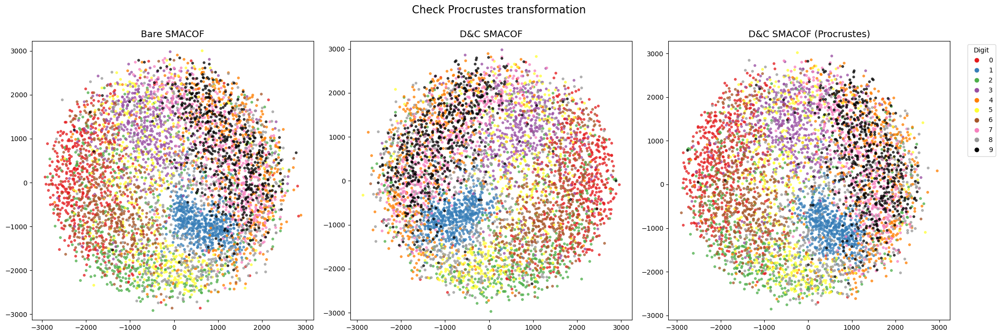

In [14]:
# Define plotting helpers
digits = np.unique(sampled_target1)
set1_colors = list(plt.get_cmap('Set1').colors)
if len(set1_colors) < len(digits): # Ensure enough colors
    set1_colors.extend([(0,0,0)] * (len(digits) - len(set1_colors))) # Extend with black if needed
cmap = mcolors.ListedColormap(set1_colors[:len(digits)])

legend_handles = [mlines.Line2D([], [], linestyle='None', marker='o',
                                markersize=7,
                                markerfacecolor=cmap(i),
                                markeredgewidth=0,
                                label=str(int(digit)))
                  for i, digit in enumerate(digits)]

# Data for plotting
embeddings_to_plot = [
    ("Bare SMACOF", MNIST_bare1),
    ("D&C SMACOF", MNIST_dc1),
    ("D&C SMACOF (Procrustes)", MNIST_dc1_procrustes)
]

fig, axes = plt.subplots(1, 3, figsize=(21, 7)) # Create a 1x3 grid of subplots
fig.suptitle('Check Procrustes transformation', fontsize=16, y=1.0)

for i, (name, embedding_data) in enumerate(embeddings_to_plot):
    ax = axes[i] # Select the i-th subplot
    for j, digit in enumerate(digits):
        mask = sampled_target1 == digit
        ax.scatter(embedding_data[mask, 0], embedding_data[mask, 1], color=cmap(j), label=str(int(digit)), s=10, alpha=0.7)
    
    ax.set_title(f'{name}', fontsize=14)
    ax.axis('equal')
    if i == len(embeddings_to_plot) - 1: # Add legend to the last plot
        ax.legend(handles=legend_handles, title="Digit", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

It looks like the Procrustes transformation is not capable of rotating the D&C embedding so that digits are aligned with those of bare SMACOF. Hence, we will apply Procrustes to each digit independently.

In [ ]:
digits_unique = np.unique(sampled_target1)
MNIST_dc1_procrustes2 = np.empty_like(MNIST_dc1)  # Initialize array for results

for digit_val in digits_unique:
    mask = (sampled_target1 == digit_val)

    bare_subset_digit = MNIST_bare1[mask]
    dc_subset_digit = MNIST_dc1[mask]

    # Get c_points of x and target
    c_points = min(
        bare_subset_digit.shape[0], dc_subset_digit.shape[0])
    
    x_ref = dc_subset_digit[:c_points, :]
    target_ref = bare_subset_digit[:c_points, :]

    aligned_dc_subset_digit = perform_procrustes(
        x_ref, target_ref, dc_subset_digit)
    MNIST_dc1_procrustes2[mask] = aligned_dc_subset_digit

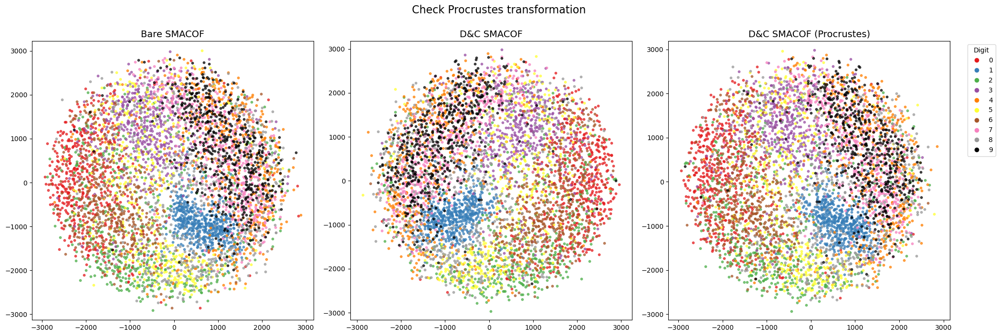

In [18]:
# Define plotting helpers
digits = np.unique(sampled_target1)
set1_colors = list(plt.get_cmap('Set1').colors)
if len(set1_colors) < len(digits):  # Ensure enough colors
    # Extend with black if needed
    set1_colors.extend([(0, 0, 0)] * (len(digits) - len(set1_colors)))
cmap = mcolors.ListedColormap(set1_colors[:len(digits)])

legend_handles = [mlines.Line2D([], [], linestyle='None', marker='o',
                                markersize=7,
                                markerfacecolor=cmap(i),
                                markeredgewidth=0,
                                label=str(int(digit)))
                  for i, digit in enumerate(digits)]

# Data for plotting
embeddings_to_plot = [
    ("Bare SMACOF", MNIST_bare1),
    ("D&C SMACOF", MNIST_dc1),
    ("D&C SMACOF (Procrustes)", MNIST_dc1_procrustes2)
]

# Create a 1x3 grid of subplots
fig, axes = plt.subplots(1, 3, figsize=(21, 7))
fig.suptitle('Check Procrustes transformation', fontsize=16, y=1.0)

for i, (name, embedding_data) in enumerate(embeddings_to_plot):
    ax = axes[i]  # Select the i-th subplot
    for j, digit in enumerate(digits):
        mask = sampled_target1 == digit
        ax.scatter(embedding_data[mask, 0], embedding_data[mask, 1], color=cmap(
            j), label=str(int(digit)), s=10, alpha=0.7)

    ax.set_title(f'{name}', fontsize=14)
    ax.axis('equal')
    if i == len(embeddings_to_plot) - 1:  # Add legend to the last plot
        ax.legend(handles=legend_handles, title="Digit",
                  bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [19]:
# Estimate densities
digits = np.unique(sampled_target1)
densities = {}

for method_name, embedding in [("Bare SMACOF", MNIST_bare1), ("D&C SMACOF", MNIST_dc1_procrustes2)]:
    densities[method_name] = {}
    for digit in digits:
        mask = sampled_target1 == digit
        data = embedding[mask].T
        kde = gaussian_kde(data)
        densities[method_name][int(digit)] = kde

In [8]:
n = 5000

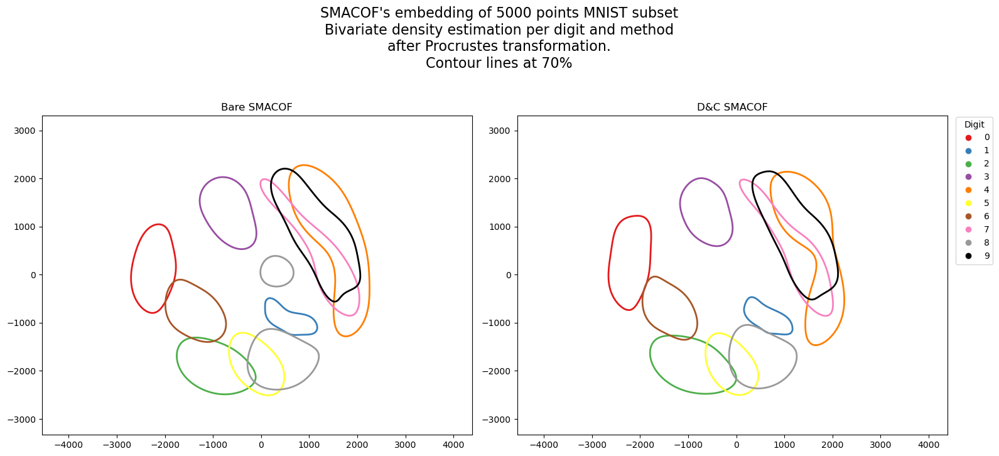

In [ ]:
# Contour plot estimated densities
set1_colors = list(plt.get_cmap('Set1').colors)
set1_colors.append((0, 0, 0))  # Add black if needed
cmap = mcolors.ListedColormap(set1_colors)

method_names = ["Bare SMACOF", "D&C SMACOF"]
embeddings = [MNIST_bare1, MNIST_dc1_procrustes]

# Compute meshgrid for contours
all_x = np.concatenate([emb[:, 0] for emb in embeddings])
all_y = np.concatenate([emb[:, 1] for emb in embeddings])
xpad = (all_x.max() - all_x.min()) * 0.05
ypad = (all_y.max() - all_y.min()) * 0.05
xmin, xmax = all_x.min() - xpad, all_x.max() + xpad
ymin, ymax = all_y.min() - ypad, all_y.max() + ypad
xx, yy = np.meshgrid(
    np.linspace(xmin, xmax, 200),
    np.linspace(ymin, ymax, 200)
)

fig, axes = plt.subplots(1, 2, figsize=(16, 7))
contour_level = 0.7

for col, method in enumerate(method_names):
    ax = axes[col]
    for i, digit in enumerate(digits):
        kde = densities[method][int(digit)]
        zz = kde(np.vstack([xx.ravel(), yy.ravel()])).reshape(xx.shape)
        ax.contour(xx, yy, zz, levels=[zz.max() * contour_level], colors=[cmap(i)], linewidths=2)
    ax.set_title(f"{method}")
    ax.axis('equal')
    if col == 1:
        # Custom legend on the right plot
        legend_handles = [mlines.Line2D([], [], linestyle='None', marker='o',
                                        markersize=7,
                                        markerfacecolor=cmap(i),
                                        markeredgewidth=0,
                                        label=int(digit))
                          for i, digit in enumerate(digits)]
        ax.legend(handles=legend_handles, title="Digit",
                  bbox_to_anchor=(1.01, 1.01), loc='upper left')
fig.suptitle(
    f"SMACOF's embedding of {n} points MNIST subset\nBivariate density estimation per digit and method\nafter Procrustes transformation.\nContour lines at {contour_level*100:.0f}%", fontsize=16, y=1.03)
plt.tight_layout()
plt.show()

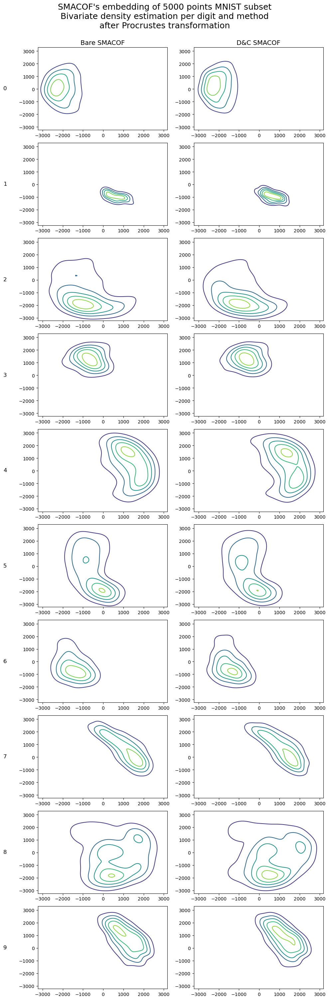

In [21]:
# Compare each digit with more contour lines
digits = np.unique(sampled_target1)
method_names = ["Bare SMACOF", "D&C SMACOF"]
embeddings = [MNIST_bare1, MNIST_dc1_procrustes2]

# Compute meshgrid across all digits and methods
all_x = np.concatenate([emb[:, 0] for emb in embeddings])
all_y = np.concatenate([emb[:, 1] for emb in embeddings])
xpad = (all_x.max() - all_x.min()) * 0.05
ypad = (all_y.max() - all_y.min()) * 0.05
xmin, xmax = all_x.min() - xpad, all_x.max() + xpad
ymin, ymax = all_y.min() - ypad, all_y.max() + ypad

xx, yy = np.meshgrid(
    np.linspace(xmin, xmax, 100),
    np.linspace(ymin, ymax, 100)
)

# Create plot grid
fig, axes = plt.subplots(len(digits), len(method_names), figsize=(
    10, 30), sharex=False, sharey=False)
for row, digit in enumerate(digits):
    for col, method in enumerate(method_names):
        ax = axes[row, col]
        kde = densities[method][int(digit)]
        zz = kde(np.vstack([xx.ravel(), yy.ravel()])).reshape(xx.shape)
        ax.contour(xx, yy, zz, levels=5, cmap='viridis')
        if col == 0:
            ax.set_ylabel(f"{int(digit)}", fontsize=12,
                          rotation=0, labelpad=30, va='center')
        if row == 0:
            ax.set_title(method_names[col], fontsize=14)
fig.suptitle(f"SMACOF's embedding of {n} points MNIST subset\nBivariate density estimation per digit and method\nafter Procrustes transformation",
             fontsize=18, y=1)
plt.tight_layout()
plt.show()